In [1]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
%matplotlib inline
%reload_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import ipywidgets
from ipywidgets import interact, interact_manual
import os
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()

import sklearn
from sklearn.svm import LinearSVC, SVC
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn import tree
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, ExtraTreesClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.metrics import (precision_recall_curve,
                                 PrecisionRecallDisplay)
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import make_scorer
from scipy import stats

search for root_dir and set working directory
Working directory set to: /mnt/ssd/git/dynamic-cmr-models


# Calculate the Binary LGE hit or miss ratios
Between LGE Segments and Segments defined by Circle or Tarique

## Column: 'Tarique abnormal'

bullsplot used here
tarique, bullsplot, motion curves
11 - mid inferolateral 

first: quality check: single segments only is very rare, two segments are better/more often that means more plausible. Not just the septum is affected. If all segments are affected, tracking may be wrong. 
second: based on experience, 11 and 12 AHA are mostly affected. Check also on circumferential and radial strain values, are they low? Bullseye plot is used for help.

## Column: 'Strain diff' 

Bezieht sich auf die orginal column: 'Segment from strain if different'

- tarique says this is difference between D and F
- tarique says this column is not helpful
- tarique says this columns relates to if different from LGE

He also said that this column shows the additional segments when he applies the Strain thresholding



# Define some helper functions

In [2]:
def my_spec(gt,pred):
        tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
        specificity = tn / (tn+fp)
        return specificity
def my_sens(gt,pred):
    tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
    sensitivity = tp / (tp+fn)
    return sensitivity

spec_m = make_scorer(my_spec, greater_is_better=True)
sens_m = make_scorer(my_sens, greater_is_better=True)
roc_m = make_scorer(sklearn.metrics.roc_auc_score, greater_is_better=True )
rec_m = make_scorer(sklearn.metrics.recall_score, greater_is_better=True )
acc_m = make_scorer(sklearn.metrics.accuracy_score, greater_is_better=True)
bacc_m = make_scorer(sklearn.metrics.balanced_accuracy_score, greater_is_better=True)
prec_m = make_scorer(sklearn.metrics.precision_score, greater_is_better=True)
f1_m = make_scorer(sklearn.metrics.f1_score, greater_is_better=True)

def get_peak_rs_cs(df, per_phase=True):
    
    if per_phase:
        # by phase
        pcs = df[df['phase']==1]['our_cs'].values
        prs = df[df['phase']==1]['our_rs'].values
        
    else:
        # get the peak radial and circumferential strains from all time steps
        # min/max
        pcs = np.stack(df.groupby(['phase'])['our_cs'].apply(list).values).astype(np.float32)
        pcs = pcs.min(axis=0)
        prs = np.stack(df.groupby(['phase'])['our_rs'].apply(list).values).astype(np.float32)
        prs = prs.max(axis=0)
        
    return prs, pcs

def create_df_peak(df_strain_comp, df_strain_p2p):
    # peak radial and circumferential strain
    
    df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    
    # composed peak by phase
    prs_com_p, pcs_com_p = get_peak_rs_cs(df_strain_comp, per_phase=True)
    # composed peak by max/min
    prs_com_arg, pcs_com_arg = get_peak_rs_cs(df_strain_comp, per_phase=False)
    # p2p peak by phase
    prs_p2p_p, pcs_p2p_p = get_peak_rs_cs(df_strain_p2p, per_phase=True)
    # p2p peak by max/min
    prs_p2p_arg, pcs_p2p_arg = get_peak_rs_cs(df_strain_p2p, per_phase=False)

    # 57 patients x 16 segments = 912 --> Peak strain per patient and segment
    df_peak = df_strain_comp[df_strain_comp['phase']==0].copy()

    # composed phase
    df_peak['prs_com_p']=prs_com_p
    df_peak['pcs_com_p']=pcs_com_p
    # composed arg-min/max
    df_peak['prs_com_arg']=prs_com_arg
    df_peak['pcs_com_arg']=pcs_com_arg
    # p2p phase
    df_peak['prs_p2p_p']=prs_p2p_p
    df_peak['pcs_p2p_p']=pcs_p2p_p
    # p2p arg-min/max
    df_peak['prs_p2p_arg']=prs_p2p_arg
    df_peak['pcs_p2p_arg']=pcs_p2p_arg
    # minor cleaning and dtype casting
    df_peak.drop(labels='phase', axis=1, inplace=True)
    df_peak.drop(labels='our_rs', axis=1, inplace=True)
    df_peak.drop(labels='our_cs', axis=1, inplace=True)
    df_peak.sort_values(by=['pat', 'aha'], inplace=True)
    df_peak = df_peak.apply(lambda x: x.astype(np.float32, errors='ignore'), axis=0)
    print(df_peak.shape)
    return df_peak


def cross_validate_f1(x,y):
    import matplotlib.pyplot as plt
    import matplotlib as mpl
    mpl.rcParams.update(mpl.rcParamsDefault)
    plt.rcParams.update({'font.size': 16})
    from sklearn.model_selection import StratifiedKFold
    skf = StratifiedKFold(n_splits=5)
    cv = 5
    clfs = {}
    
    clfs['Logistic Regression'] = LogisticRegression(random_state=1, class_weight='balanced', max_iter=1000)
    clfs['Random Forest'] = make_pipeline(StandardScaler(), RandomForestClassifier(n_estimators=500, random_state=1, class_weight='balanced')) #RandomForestClassifier(n_estimators=100, random_state=1, class_weight='balanced')
    clfs['Naive Bayes'] = GaussianNB()
    clfs['Scaled DecissionTree'] = make_pipeline(StandardScaler(), tree.DecisionTreeClassifier(class_weight='balanced'))
    clfs['KNN'] = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=2))
    clfs['Scaled SVC(poly)'] = make_pipeline(StandardScaler(), SVC(kernel='rbf',gamma='auto',class_weight='balanced', C=100))
    clfs['SVC(poly)'] = SVC(kernel='rbf', gamma='auto',class_weight='balanced', C=100)
    # ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’
    # NeighborhoodComponentsAnalysis(n_components=10, random_state=random_state),
 
    clfs['Ensemble'] = VotingClassifier(
        estimators=[
            
            ('lr', clfs['Logistic Regression']), 
            ('rf', clfs['Random Forest']), 
            ('gnb', clfs['Naive Bayes']),
            ('svc', clfs['Scaled SVC(poly)']),
            ('dt', clfs['Scaled DecissionTree'])
                   ],
        voting='hard')
    
    
    fig, ax = plt.subplots(1,8, figsize=(25,5))
    i = 0
    for label,clf in clfs.items():   
        y_pred = cross_val_predict(clf, x, y, cv=cv)
        #scoring=['f1','recall', 'balanced_accuracy', my_sens, my_spec]
        scoring={'f1':f1_m,'recall':rec_m, 'balanced_accuracy':bacc_m, 'sens':sens_m, 'spec': spec_m}
        scores = cross_validate(clf, x, y, scoring=scoring, cv=cv)
        print('*'*10,label,'*'*10)
        print(scores['test_recall'])
        #print(scores)
        print("Balanced accuracy: %0.2f (+/- %0.2f) [%s]" % (scores['test_balanced_accuracy'].mean(), scores['test_balanced_accuracy'].std(), label))
        print("Sensitivity: %0.2f (+/- %0.2f) [%s]" % (scores['test_sens'].mean(), scores['test_sens'].std(), label))
        print("Specifity: %0.2f (+/- %0.2f) [%s]" % (scores['test_spec'].mean(), scores['test_spec'].std(), label))
        #print("F1: %0.2f (+/- %0.2f) [%s]" % (scores['test_f1'].mean(), scores['test_f1'].std(), label))
        #print("Recall: %0.2f (+/- %0.2f) [%s]" % (scores['test_recall'].mean(), scores['test_recall'].std(), label))
        
        ConfusionMatrixDisplay.from_predictions(y, y_pred, labels=[1,0],ax=ax[i], colorbar=False)
        ax[i].set_title(label)
        ax[i].xaxis.label.set_visible(False)
        ax[i].yaxis.label.set_visible(False)
        i = i + 1
    plt.show()
    
def create_grid_search():
    gammas = [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7, 'scale', 'auto']
    Cs = [0.1, 1, 5, 10, 20, 100, 1e3]
    kernels = ['linear', 'poly', 'rbf', 'sigmoid']
    weights = [None, 'balanced']
    degree = [2,3,4,5]
    n_estimators = [10,100,500,1000]
    criterions = ['gini', 'entropy', 'log_loss']

    penalties = ['l2']
    solvers = ['liblinear']

    scaler = [StandardScaler(), MinMaxScaler(), None]
    
    from sklearn.model_selection import StratifiedKFold, KFold
    skf = StratifiedKFold(n_splits=5)
    #skf = KFold(n_splits=5)

    [ 
     'standardscaler__copy', 'standardscaler__with_mean', 'standardscaler__with_std', 
     'svc__C', 'svc__break_ties', 'svc__cache_size', 'svc__class_weight', 'svc__coef0', 
     'svc__decision_function_shape', 'svc__degree', 'svc__gamma', 'svc__kernel', 'svc__max_iter', 
     'svc__probability', 'svc__random_state', 'svc__shrinking', 'svc__tol', 'svc__verbose']

    svc_params = {'clf':(SVC(),), 
                  'clf__gamma': gammas, 
                  'clf__C': Cs, 
                  'clf__kernel': kernels, 
                  'clf__class_weight':weights,
                 'scaler': scaler}
    
    ################ ensemble #############
    clf1 = LogisticRegression(random_state=1, class_weight='balanced', penalty='l2',)
    clf2 = RandomForestClassifier(n_estimators=100, random_state=1, class_weight='balanced')
    clf4 = tree.DecisionTreeClassifier(class_weight='balanced')
    clf6 = SVC(kernel='poly',gamma='scale',class_weight='balanced', C=1, degree=3)
    
    eclf = VotingClassifier(
        estimators=[
            ('lr', clf1), 
            ('rf', clf2),
            ('svc', clf6)
                   ],
        voting='hard')
    
    ens_params = {'clf':(eclf,),
                 'scaler': scaler}
    
    
    rf_params = {'clf':(RandomForestClassifier( random_state=1, class_weight='balanced'),),
                'clf__n_estimators':n_estimators,
                 'clf__class_weight':weights,
                'scaler': scaler}
    lr_params = {'clf':(LogisticRegression(random_state=1, max_iter=10000,class_weight='balanced'),),
                 'clf__class_weight':weights,
                 'clf__penalty':penalties,
                 'clf__C': Cs,
                 'clf__solver': solvers,
                'scaler': scaler}
    et_params = {'clf': (ExtraTreesClassifier(n_estimators=250, max_depth=5, random_state=1),),
                 'clf__n_estimators':n_estimators,
                'scaler': scaler}
    dt_params = {'clf': (tree.DecisionTreeClassifier(class_weight='balanced'),),
                 'clf__criterion':criterions,
                'scaler': scaler}
    
    params = [rf_params, svc_params, lr_params, et_params, dt_params]#, ens_params]


    pipeline = Pipeline( steps=[
        ('scaler',StandardScaler()), 
        ('clf', SVC())
    ])
    scoring={'f1':f1_m,'recall':rec_m, 'balanced_accuracy':bacc_m, 'sens':sens_m, 'spec': spec_m, 'roc_auc':roc_m, 'precision':prec_m, 'accuracy':acc_m}
    #scoring = ['recall', 'accuracy', 'balanced_accuracy', 'average_precision','precision', 'f1', 'roc_auc']
    return GridSearchCV(estimator=pipeline, 
                        param_grid=params, 
                        scoring=scoring, 
                        refit='balanced_accuracy', # f1, balanced_accuracy
                        cv=skf,
                        n_jobs=16)

def ttest_per_keyframe(df):
    ps = {}
    ps = {}
    temp_y = np.stack(df.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
    temp_y_patients = temp_y.sum(axis=1)>0
    pat_pos = df.pat.unique()[temp_y_patients==True]
    pat_neg = df.pat.unique()[temp_y_patients==False]
    
    df_pos = df[df['pat'].isin(pat_pos)]
    df_neg = df[df['pat'].isin(pat_neg)]
    for p in df.phase.unique():
        df_pos_ = df_pos[df_pos.phase.isin([p])]
        df_neg_ = df_neg[df_neg.phase.isin([p])]
        ps['{}_{}'.format('rs', p)] = stats.ttest_ind(df_neg_['our_rs'], df_pos_['our_rs'])[1]
        ps['{}_{}'.format('cs', p)] = stats.ttest_ind(df_neg_['our_cs'], df_pos_['our_cs'])[1]
    return ps

def plot_strain_per_time(df, title=None, method=None, hue='lge'):
    # method: (str): enum, one of p2p, comp, window
    import seaborn
    from scipy import stats
    sb.set_context('paper')
    sb.set(font_scale = 1.5)
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    
    # scale to % values
    df = df.copy()
    df['our_rs'] = df['our_rs'] * 100
    df['our_cs'] = df['our_cs'] * 100
    
    # added
    ps = ttest_per_keyframe(df)
    """for p in df.phase.unique():
        print('phase: {}, strain: {} - {}, p={:.4f}'.format(p,method, 'our_rs', ps['{}_{}'.format('rs', p)]))
        print('phase: {}, strain: {} - {}, p={:.4f}'.format(p,method, 'our_cs', ps['{}_{}'.format('cs', p)]))"""
    
    if method=='p2p':
        phases = ['MD-ED', 'ED-MS','MS-ES','ES-PF','PF-MD']
    elif method == 'comp':
        phases = ['ED-ED', 'ED-MS','ED-ES','ED-PF','ED-MD']
    elif method == 'window':
        phases = ['ED-w-->ED','MS-w-->MS','ES-w-->ES','PF-w-->PF','MD-w-->MD']
    ax1, ax2 = ax
    ax1 = sb.lineplot(x="phase", y="our_cs",
                      hue=hue,
                      err_style='band', legend=False,ax=ax1,
                 data=df)
    ax1 = sb.violinplot(x="phase", y="our_cs",inner='quart',
                   ax=ax1,
                 data=df, 
                        split=True,hue=hue
                       )
    ax1 = sb.stripplot(x="phase", y="our_cs",
                   ax=ax1,
                 data=df, 
                        hue=hue
                       )
    #_ = ax1.set_ylim((-25., 25))
    _ = ax1.set_xticks([0, 1, 2, 3, 4], minor=False)
    _ = ax1.set_xticklabels(phases)
    _ = ax1.legend(['neg','pos'])
    _ = ax1.set_xlabel('')
    _ = ax1.set_ylabel('Circumferential Strain (%)')

    ax2 = sb.lineplot(x="phase", y="our_rs",
                 hue=hue,
                      err_style='band', legend=False,ax=ax2,
                 data=df)
    ax2 = sb.violinplot(x="phase", y="our_rs",inner='quart',
                   ax=ax2,
                 data=df, 
                        split=True,hue=hue
                       )
    ax2 = sb.stripplot(x="phase", y="our_rs",
                   ax=ax2,
                 data=df, 
                        hue=hue
                       )

    #_ = ax2.set_ylim((-25, 150))
    _ = ax2.set_xticks([0, 1, 2, 3, 4], minor=False)
    _ = ax2.set_xticklabels(phases)
    _ = ax2.legend(['neg','pos'])
    _ = ax2.set_xlabel('')
    _ = ax2.set_ylabel('Radial Strain (%)')
    if title is not None:
        fig.suptitle(title)
        
    # annotate the xticks with ttest p-values
    y_rs = 0.02 + df['our_rs'].max()
    y_cs = 0.02 + df['our_cs'].max()
    sig_niv = 0.05
    
    for xtick in ax1.get_xticks():
        ax1.text(xtick, y_cs, '{}'.format('**' if ps['{}_{}'.format('cs', xtick)]<sig_niv else ''),
                      horizontalalignment='center', size='small', color='black')
    
    for xtick in ax2.get_xticks():
        ax2.text(xtick, y_rs, '{}'.format('**' if ps['{}_{}'.format('rs', xtick)]<sig_niv else ''),
                      horizontalalignment='center', size='small', color='black')

        
    plt.tight_layout()
    return fig

def plot_report(clf, x, y, label=''):
    global hits, y_pred
    pats = np.stack(df_strain_comp.groupby(['pat','aha'])['pat'].apply(list).values)[0]    
    clf = clf.set_params(**label)
    skf = StratifiedKFold(n_splits=5)
    y_pred = cross_val_predict(clf, x, y, cv=skf)
    hits = y_pred==y
    scores2 = cross_validate(clf, x, y, scoring={'specificity':spec_m, 'sensitivity': sens_m, 'roc': roc_m, 'recall': rec_m, 
                                                 'accuracy': acc_m, 'balanced_accuracy': bacc_m, 'precision': prec_m, 'f1':f1_m}, cv=skf)
    print("Specifity: {:0.2f} (+/- {:0.2f})".format(scores2['test_specificity'].mean(), scores2['test_specificity'].std(), ""))
    print("Sensitivity: {:0.2f} (+/- {:0.2f})".format(scores2['test_sensitivity'].mean(), scores2['test_sensitivity'].std(), ""))
    print('params: {}'.format(label))
    print("Recall: {:0.2f} (+/- {:0.2f})".format(scores2['test_recall'].mean(), scores2['test_recall'].std()))
    print("Accuracy: {:0.2f} (+/- {:0.2f})".format(scores2['test_accuracy'].mean(), scores2['test_accuracy'].std()))
    print("Precision: {:0.2f} (+/- {:0.2f})".format(scores2['test_precision'].mean(), scores2['test_precision'].std()))
    print("Balanced Accuracy: {:0.2f} (+/- {:0.2f})".format(scores2['test_balanced_accuracy'].mean(), scores2['test_balanced_accuracy'].std()))
    print("F1: {:0.2f} (+/- {:0.2f})".format(scores2['test_f1'].mean(), scores2['test_f1'].std()))
    print("AUC: {:0.2f} (+/- {:0.2f})".format(scores2['test_roc'].mean(), scores2['test_roc'].std()))
    disp = ConfusionMatrixDisplay.from_predictions(y, y_pred,labels=[1,0], display_labels=['positive','negative'],colorbar=True)
    disp = PrecisionRecallDisplay.from_predictions(y,y_pred)

# Read the dmd dataframe with all timesteps

In [8]:
from ipyfilechooser import FileChooser
# /mnt/ssd/git/dynamic-cmr-models/exp/p2p/dmd/v4/ablation/
# /mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/ablation/
import os
path_chooser = FileChooser(os.path.join(os.getcwd(),'/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/jcmr/'), '')
display(path_chooser)
@interact_manual
def load_strain_values():
    global df_strain_comp, df_strain_p2p
    
    #/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2
    #df_strain_comp = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2/df_DMD_time_ed2p.csv')
    #df_strain_p2p = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2/df_DMD_time_p2p.csv')
    df_strain_comp = pd.read_csv(os.path.join(path_chooser.selected, 'df_DMD_time_ed2p.csv'))
    df_strain_p2p = pd.read_csv(os.path.join(path_chooser.selected,'df_DMD_time_p2p.csv'))
    df_strain_comp['dmd'] = 1
    df_strain_p2p['dmd'] = 1

    try: # integration of the controls, if requested/given
        df_strain_comp_c = pd.read_csv(os.path.join(path_chooser.selected, 'controls','df_DMD_time_ed2p.csv'))
        df_strain_p2p_c = pd.read_csv(os.path.join(path_chooser.selected,'controls','df_DMD_time_p2p.csv'))
        print('concat some controls!', df_strain_comp.shape)
        df_strain_comp_c['dmd'] = 0
        df_strain_p2p_c['dmd'] = 0
        df_strain_comp_c.sort_values(by=['pat', 'aha'], inplace=True)
        df_strain_p2p_c.sort_values(by=['pat', 'aha'], inplace=True)

        df_strain_comp = pd.concat([df_strain_comp, df_strain_comp_c], axis=0)
        df_strain_p2p = pd.concat([df_strain_p2p, df_strain_p2p_c], axis=0) 
        print('found some controls!', df_strain_comp.shape)
    except Exception as e:
        pass

    df_strain_comp.sort_values(by=['pat', 'aha'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha'], inplace=True)
    print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
    print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])

    #df_strain_comp = df_strain_comp.fillna(df_strain_comp.mean())
    #df_strain_p2p = df_strain_p2p.fillna(df_strain_p2p.mean())

    print('shape y == number of patients: ', len(df_strain_p2p.pat.unique()))
    print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
    print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])
    print(df_strain_comp.shape)
    print(df_strain_p2p.shape)
    df_strain_comp.head()
    # we need to make sure that we differentate lge pos/neg on a patient level on all segments, not only on the segments of interest
    print(df_strain_comp.describe())

FileChooser(path='/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/jcmr', filename='', title='HTML(v…

interactive(children=(Button(description='Run Interact', style=ButtonStyle()), Output()), _dom_classes=('widge…

# Choose the features for the patient-based LGE+ classification

In [38]:
# Pipeline with all cells for classification
@interact_manual
def choose_features(df_strain_comp=['df_strain_comp'], df_strain_p2p=['df_strain_p2p'],
                    segments=[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], [5,6,7,8,9,10,11,12]],
                    target=['lge','dmd'],
                    threshold='0',
                    p2p_features=True,
                    use_ED=False,
                    use_MS=False,
                    use_ES=False,
                    use_PF=False,
                    use_MD=False,
                    per_patient=True,
                    p2p=True,
                    comp=False,
                    peak=True,
                    argmax=True,
                   cs=True,
                   rs=True):
    global x,y, df_peak
    threshold = float(threshold)
    df_strain_comp = globals().get(df_strain_comp)
    df_strain_p2p = globals().get(df_strain_p2p)
    
    df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    
    #y = (df_strain_p2p.groupby('pat')['lge'].sum()>0).values
    #y = (df_strain_p2p.groupby('pat')['lge'].sum()/5).values
    y = (df_strain_p2p[df_strain_p2p['phase']==0].groupby('pat')[target].sum()>threshold).values
    #y = (df_strain_p2p.groupby('pat')['lge'].sum()>threshold).values
    print('shape y == number of patients: ', len(df_strain_p2p.pat.unique()))
    print('lge pos: ', y.sum(), 'lge neg: ', (y==False).sum())
    
    print('shape: p2p strain df: ',df_strain_p2p.shape)
    #df_strain_p2p = df_strain_p2p[df_strain_p2p['aha'].isin(segments)]
    #df_strain_comp = df_strain_comp[df_strain_comp['aha'].isin(segments)]
    print('shape: p2p strain df: ',df_strain_p2p.shape)
    
    df_peak = create_df_peak(df_strain_comp=df_strain_comp,df_strain_p2p=df_strain_p2p)
    df_peak.sort_values(by=['pat', 'aha'], inplace=True)
    xs = []
    ps = [i for i,bool_ in enumerate([use_ED, use_MS, use_ES, use_PF, use_MD]) if bool_]
    
    if p2p_features:
        cs_phases = [1,2,4]
        xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(cs_phases)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))

    else:
        if per_patient:
            if any(ps): # select the phases manually
                print(ps)
                if p2p:
                    if cs:xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:
                        temp = np.stack(df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32)
                        '''temp = np.array([temp[:,:6],temp[:,6:12],np.stack([temp[:,12], temp[:,13],temp[:,13], temp[:,14], temp[:,15], temp[:,15]], axis=1)])
                        temp = np.gradient(temp)[1]
                        print(temp.shape)
                        temp = np.concatenate([temp[:,0], temp[:,1], temp[:,2,0:2],temp[:,2,3:4]], axis=1)
                        print(temp.shape)
                        temp = temp.reshape(57,16)'''
                        xs.append(temp)
                    assert all(y == (df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])[target].sum()>threshold).values)
                if comp:
                    if cs:xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(ps)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(ps)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
                    assert all(y == (df_strain_comp[df_strain_p2p['phase']==0].groupby(['pat'])[target].sum()>0).values)
            else: # use the peak or use all phases
                if peak and p2p and comp and argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_arg'].apply(list).values).astype(np.float32)) 
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_arg'].apply(list).values).astype(np.float32))
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
                elif peak and p2p and comp and not argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_p'].apply(list).values).astype(np.float32))
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_p'].apply(list).values).astype(np.float32))
                elif peak and p2p and argmax:
                    # per patient with peak values from the phases and argmax
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_arg'].apply(list).values).astype(np.float32))
                elif peak and p2p and not argmax:
                    print('use p2p peak by phase')
                    # per patient with peak values from the phases and argmax
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_p'].apply(list).values).astype(np.float32))
                elif peak and comp and argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
                elif peak and comp and not argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_p'].apply(list).values).astype(np.float32))
                elif not peak and comp:
                    if cs:xs.append(np.stack(df_strain_comp.groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_comp.groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
                elif not peak and p2p:
                    if cs:xs.append(np.stack(df_strain_p2p.groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_p2p.groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))

        else: # per segment classification
            y = np.stack(df_strain_comp.groupby(['pat','aha'])[target].apply(list).values).astype(np.float32)
            y = y.sum(axis=1)>0
            if p2p:
                xs.append(np.stack(df_strain_p2p.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32))
                xs.append(np.stack(df_strain_p2p.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32))
            if comp:
                xs.append(np.stack(df_strain_comp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32))
                xs.append(np.stack(df_strain_comp.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32))
    x = np.concatenate(xs, axis=1)
    print('shape x:', x.shape)
    print('shape y:', y.shape)
        
    cross_validate_f1(x,y)

interactive(children=(Dropdown(description='df_strain_comp', options=('df_strain_comp',), value='df_strain_com…

# Gridsearch with the features from the previous cell

In [39]:
gs = create_grid_search()
gs = gs.fit(x, y)

# create a df from the gs results
results = pd.DataFrame.from_dict(gs.cv_results_)
results["params_str"] = results.params.apply(str)
pd.set_option('display.max_colwidth', None)
results.shape

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

(1599, 80)

In [40]:
# sort by balanced acc
results.sort_values(by=['rank_test_balanced_accuracy','rank_test_recall','rank_test_f1'])[['mean_test_balanced_accuracy','mean_test_spec','mean_test_sens','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_spec,mean_test_sens,mean_test_roc_auc,params_str
439,0.786197,0.836364,0.736029,0.786197,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': MinMaxScaler()}"
438,0.777106,0.818182,0.736029,0.777106,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"
450,0.777106,0.818182,0.736029,0.777106,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__gamma': 'auto', 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"
886,0.761765,0.800000,0.723529,0.761765,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__gamma': 'auto', 'clf__kernel': 'sigmoid', 'scaler': MinMaxScaler()}"
1018,0.761765,0.800000,0.723529,0.761765,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 20, 'clf__class_weight': 'balanced', 'clf__gamma': 0.01, 'clf__kernel': 'sigmoid', 'scaler': MinMaxScaler()}"


In [41]:
# sort by spec
results.sort_values(by=['rank_test_spec','rank_test_balanced_accuracy','rank_test_recall'])[['mean_test_balanced_accuracy','mean_test_spec','mean_test_sens','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_spec,mean_test_sens,mean_test_roc_auc,params_str
219,0.550468,0.981818,0.119118,0.550468,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': StandardScaler()}"
231,0.550468,0.981818,0.119118,0.550468,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__gamma': 'auto', 'clf__kernel': 'poly', 'scaler': StandardScaler()}"
880,0.623463,0.945455,0.301471,0.623463,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__gamma': 'auto', 'clf__kernel': 'poly', 'scaler': MinMaxScaler()}"
363,0.544418,0.945455,0.143382,0.544418,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': StandardScaler()}"
1455,0.544418,0.945455,0.143382,0.544418,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1000.0, 'clf__class_weight': 'balanced', 'clf__gamma': 0.001, 'clf__kernel': 'poly', 'scaler': StandardScaler()}"


In [42]:
# sort by sens
results.sort_values(by=['rank_test_sens','rank_test_balanced_accuracy','rank_test_recall'])[['mean_test_balanced_accuracy','mean_test_spec','mean_test_sens','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_spec,mean_test_sens,mean_test_roc_auc,params_str
354,0.509091,0.018182,1.0,0.509091,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"
462,0.509091,0.018182,1.0,0.509091,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 5, 'clf__class_weight': None, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"
570,0.509091,0.018182,1.0,0.509091,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"
678,0.509091,0.018182,1.0,0.509091,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 10, 'clf__class_weight': None, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"
786,0.509091,0.018182,1.0,0.509091,"{'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'scaler': StandardScaler()}"


## Evaluate the best estimator from gridsearch CV

**Recall** in this context is also referred to as the true positive rate or sensitivity, and 

$\frac{tp}{tp+fn}$ 



**Precision** is also referred to as positive predictive value (PPV); other related measures used in classification include true negative rate and accuracy. True negative rate is also called specificity.

$\frac{tp}{tp+fp)}$



**Accuracy** (maybe missleading for imbalanced data, better --> balanced accuracy)

$\frac{tp+tn}{tp+tn+fp+fn}$



Specifity: 0.84 (+/- 0.16)
Sensitivity: 0.74 (+/- 0.06)
params: {'clf': SVC(C=1, class_weight='balanced'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': MinMaxScaler()}
Recall: 0.74 (+/- 0.06)
Accuracy: 0.77 (+/- 0.06)
Precision: 0.88 (+/- 0.10)
Balanced Accuracy: 0.79 (+/- 0.07)
F1: 0.80 (+/- 0.04)
AUC: 0.79 (+/- 0.07)


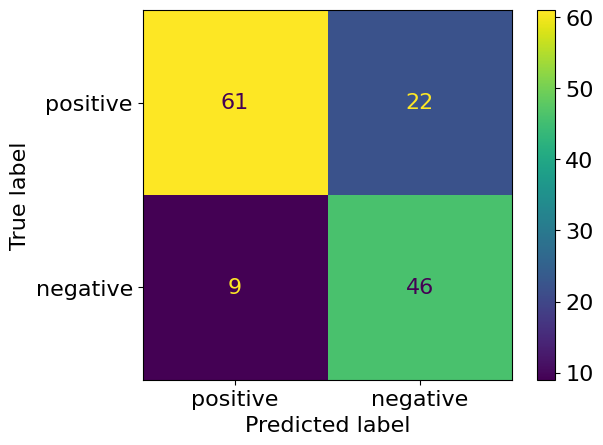

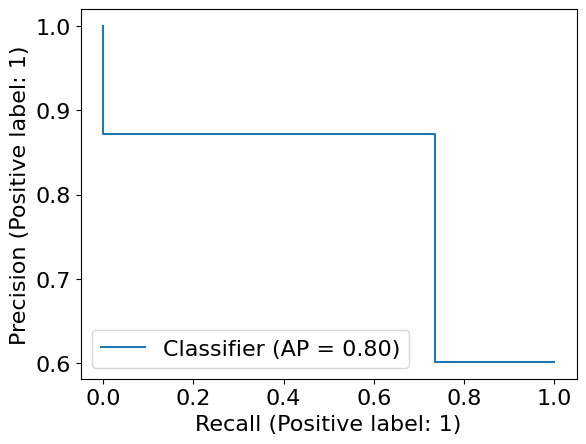

In [43]:
# use the parameters of the best classifier from the gridsearch and refit on data in CV manner 
plot_report(gs.best_estimator_, x, y, label=gs.best_params_)
plt.show()

In [33]:
pats =df_strain_p2p.sort_values(['pat'])['pat'].unique()
wrong_pats = pats[~hits]
wrong_pats

array(['aja_20230331', 'ao_20191212', 'cre_20200309', 'ct_20191108',
       'dc_20180516', 'dkt_20230414', 'emi_20210628', 'gid_20221230',
       'gm_20190604', 'gn_20190712', 'hdg_20210304', 'hh_20190621',
       'hrm_20200626', 'lag_20200108', 'lde_20230322', 'lv_20190503',
       'mr_20221118', 'ms_20191028', 'ou_20190507', 'psl_20200923',
       'pzr_20201109', 'rca_20210205', 'rje_20200117', 'rjl_20220721',
       'sc_20211209', 'sdp_20221202', 'sj_20221010', 'sk_20190318',
       'sk_20190520', 'tjd_20211008', 'wal_20200605'], dtype=object)

In [50]:
df_strain_p2p[df_strain_p2p.pat.isin(['ab_20180710', 'bo_20180709', 'ct_20191108', 'gn_20190712',
       'rg_20180919'])][df_strain_p2p.phase==0].groupby('pat')['lge'].sum()

Series([], Name: lge, dtype: float64)

In [34]:
print(df_strain_p2p[df_strain_p2p.pat.isin(wrong_pats)][df_strain_p2p.phase==0].groupby('pat')['lge'].sum())
df_strain_p2p[df_strain_p2p.pat.isin(wrong_pats)][df_strain_p2p.phase==0].groupby('pat')['lge'].apply(list)

pat
aja_20230331    2.0
ao_20191212     4.0
cre_20200309    4.0
ct_20191108     3.0
dc_20180516     0.0
dkt_20230414    5.0
emi_20210628    2.0
gid_20221230    1.0
gm_20190604     0.0
gn_20190712     2.0
hdg_20210304    6.0
hh_20190621     4.0
hrm_20200626    2.0
lag_20200108    3.0
lde_20230322    0.0
lv_20190503     1.0
mr_20221118     3.0
ms_20191028     1.0
ou_20190507     2.0
psl_20200923    6.0
pzr_20201109    0.0
rca_20210205    0.0
rje_20200117    0.0
rjl_20220721    2.0
sc_20211209     0.0
sdp_20221202    0.0
sj_20221010     7.0
sk_20190318     3.0
sk_20190520     0.0
tjd_20211008    3.0
wal_20200605    9.0
Name: lge, dtype: float64


pat
aja_20230331    [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
ao_20191212     [0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
cre_20200309    [0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
ct_20191108     [0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
dc_20180516     [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
dkt_20230414    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0]
emi_20210628    [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
gid_20221230    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]
gm_20190604     [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
gn_20190712     [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0]
hdg_20210304    [0.0, 0.0,

In [97]:
df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)

(df_strain_p2p.groupby('pat')['lge'].sum()>2).values

array([False, False, False,  True,  True,  True,  True, False,  True,
       False,  True, False, False, False, False, False,  True, False,
        True,  True,  True,  True,  True,  True, False,  True,  True,
       False,  True,  True, False, False, False, False,  True, False,
       False,  True, False,  True, False,  True, False,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True])

In [14]:
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

In [439]:
temp = df_strain_p2p[(df_strain_p2p['lge']==1)&(df_strain_p2p['aha']==2)&(df_strain_p2p['phase']==0)]['our_rs']
temp.shape

(7,)

# Violinplots of RS/CS per patient - hue=LGE+/LGE-

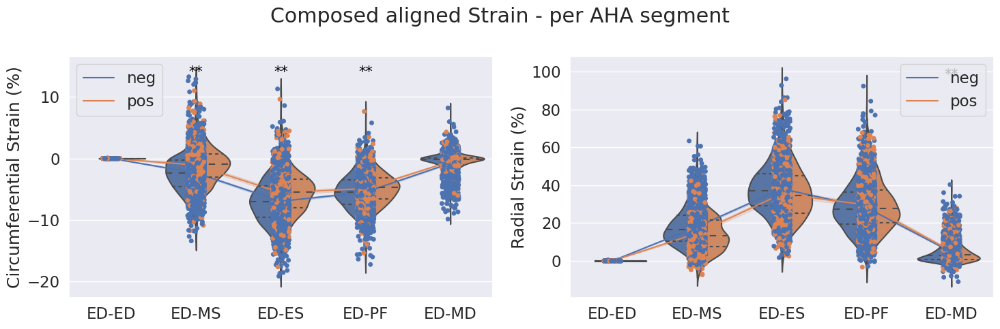

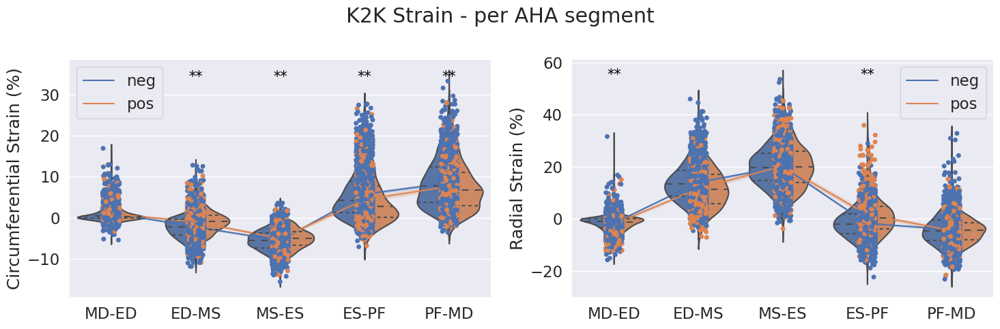

In [44]:
_ = plot_strain_per_time(df_strain_comp,title='Composed aligned Strain - per AHA segment',method='comp', hue='lge'); plt.show()
_ = plot_strain_per_time(df_strain_p2p, title='K2K Strain - per AHA segment',method='p2p', hue='lge');plt.show()

# Bullseye plots

In [20]:
from src_julian.utils.myAHAfunctions import bullseye_plot, myBullsplot
import matplotlib as mpl
@interact_manual
def show_bullseye(pat=df_strain_p2p.pat.unique()):
    phases = df_strain_p2p.phase.unique()
    lges = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==0)].lge.values
    cmap_cs = mpl.cm.autumn
    cmap_rs = mpl.cm.autumn
    
    print('Patient: {}, positive segments: {}'.format(pat, np.where(lges)[0]))
    fig, axes = plt.subplots(4, len(phases), figsize=(20, 14), subplot_kw=dict(projection='polar'))
    q = .90
    q_lower = 1-q
    
    # normalise with an upper and lower quantile to exclude outliers to dominant the plot
    # k2k RS
    p2p_rs_data = df_strain_p2p[(df_strain_p2p.pat ==pat)].our_rs.values
    p2p_rs_norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=np.quantile(a=p2p_rs_data,q=q_lower), vmax=np.quantile(a=p2p_rs_data,q=q))
    #ax_p2p_rs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_rs = mpl.colorbar.ColorbarBase(ax_p2p_rs, cmap=p2p_rs, norm=p2p_rs_norm, orientation='horizontal')
    # k2k CS
    p2p_cs_data = df_strain_p2p[(df_strain_p2p.pat ==pat)].our_cs.values
    p2p_cs_norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=np.quantile(a=p2p_cs_data,q=q_lower), vmax=np.quantile(a=p2p_cs_data,q=q))
    #ax_p2p_cs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_cs = mpl.colorbar.ColorbarBase(ax_p2p_cs, cmap=cmap_cs, norm=p2p_cs_norm, orientation='horizontal')

    # comp RS
    comp_rs_data = df_strain_comp[(df_strain_comp.pat ==pat)].our_rs.values
    comp_rs_norm = mpl.colors.Normalize( vmin=np.quantile(a=comp_rs_data,q=q_lower), vmax=np.quantile(a=comp_rs_data,q=q))
    #ax_comp_rs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_rs = mpl.colorbar.ColorbarBase(ax_comp_rs, cmap=cmap_rs, norm=comp_rs_norm, orientation='horizontal')
    # comp CS
    comp_cs_data = df_strain_comp[(df_strain_comp.pat ==pat)].our_cs.values
    comp_cs_norm = mpl.colors.Normalize(vmin=np.quantile(a=comp_cs_data,q=q_lower), vmax=np.quantile(a=comp_cs_data,q=q))
    #ax_comp_cs = fig.add_axes([1, 0.55, .07, .02])
    #cb_rr = mpl.colorbar.ColorbarBase(ax_comp_cs, cmap=cmap_cs, norm=comp_cs_norm, orientation='horizontal')
    
    
    for p in phases:
        rs = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_rs.values
        cs = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_cs.values
        axes[0,p] = myBullsplot(data=rs, norm=p2p_rs_norm, lge=lges, ax=axes[0,p], cmap=cmap_rs)
        axes[1,p] = myBullsplot(data=cs, norm=p2p_cs_norm, lge=lges, ax=axes[1,p], cmap=cmap_cs)
        
        rs = df_strain_comp[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_rs.values
        cs = df_strain_comp[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_cs.values
        axes[2,p] = myBullsplot(data=rs, norm=comp_rs_norm, lge=lges, ax=axes[2,p], cmap=cmap_rs)
        axes[3,p] = myBullsplot(data=cs, norm=comp_cs_norm, lge=lges, ax=axes[3,p], cmap=cmap_cs)
    axes[0,0].set_title('Radial Strain - k2k')
    axes[1,0].set_title('Circumferential Strain - k2k')
    axes[2,0].set_title('Radial Strain - composed')
    
    axes[3,0].set_title('Circumverential Strain - composed')
    
    #axes[0,0].colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='horizontal')
    #plt.colorbar(cax=axes)
    plt.tight_layout()
    plt.show()

interactive(children=(Dropdown(description='pat', options=('aa_20180710', 'aa_20181211', 'ab_20180710', 'ac_20…

# Violinplots of RS/CS per segment - hue=LGE+/LGE-

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


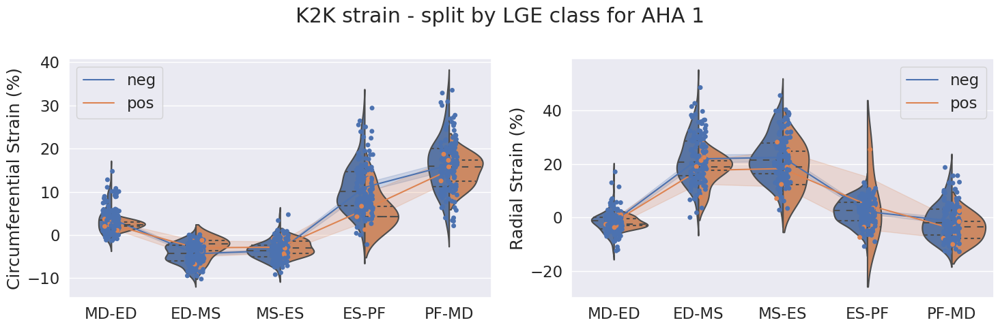

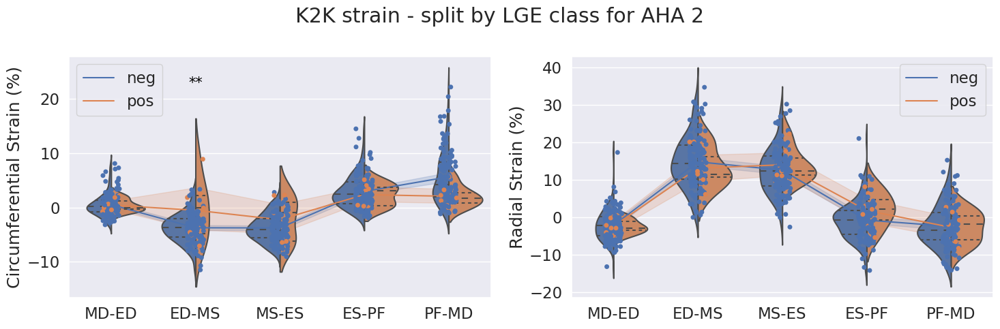

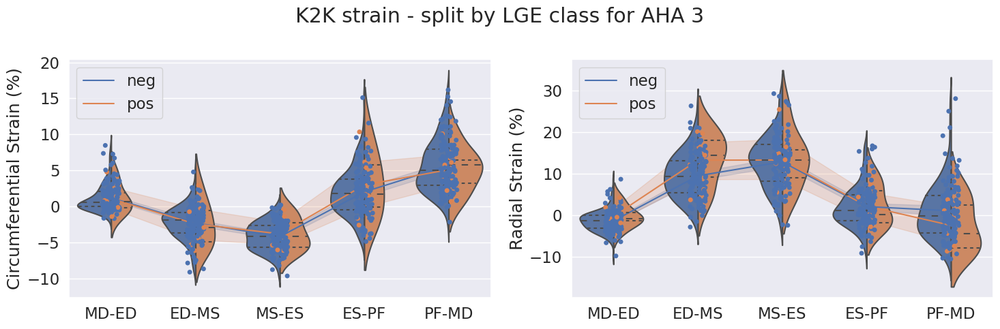

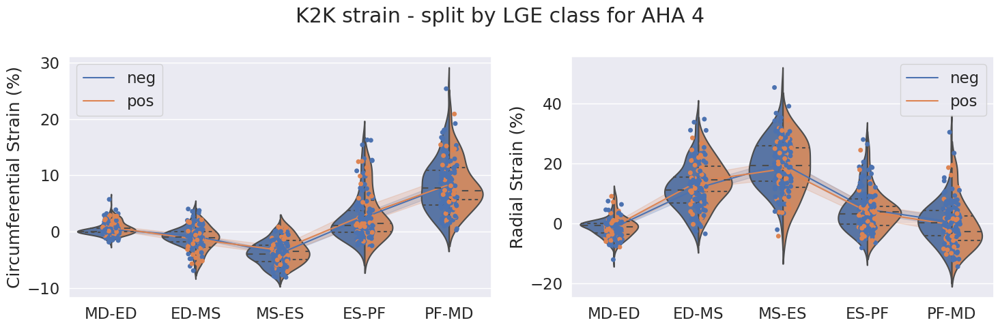

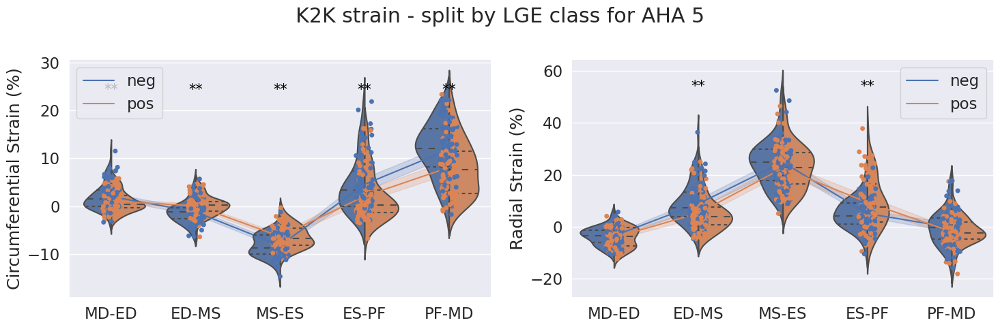

...

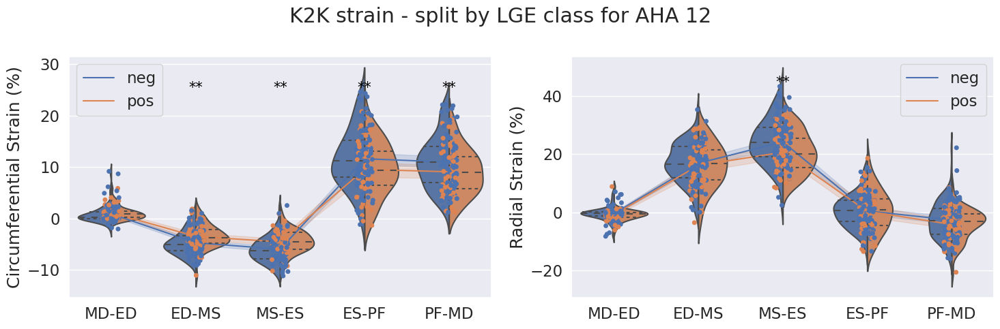

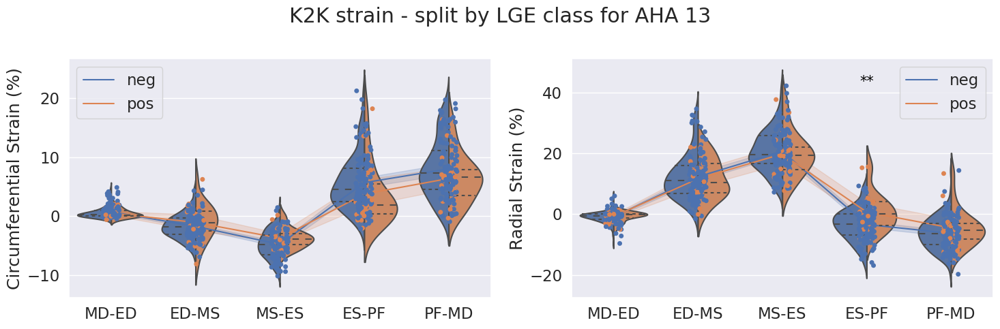

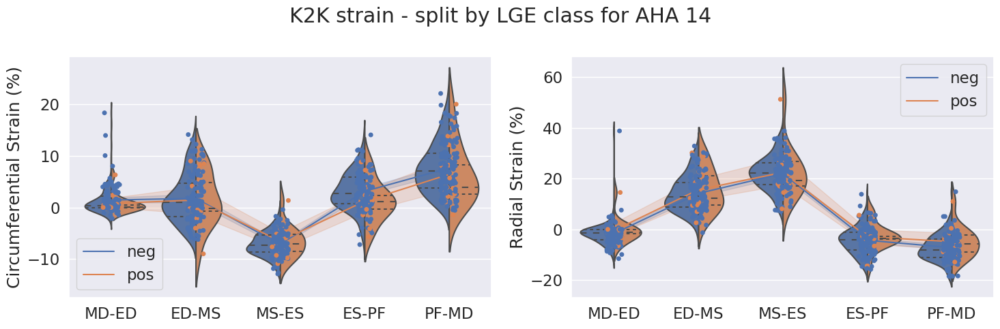

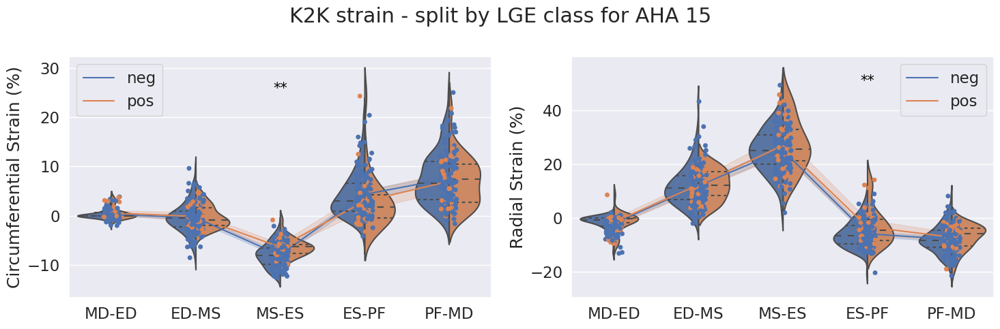

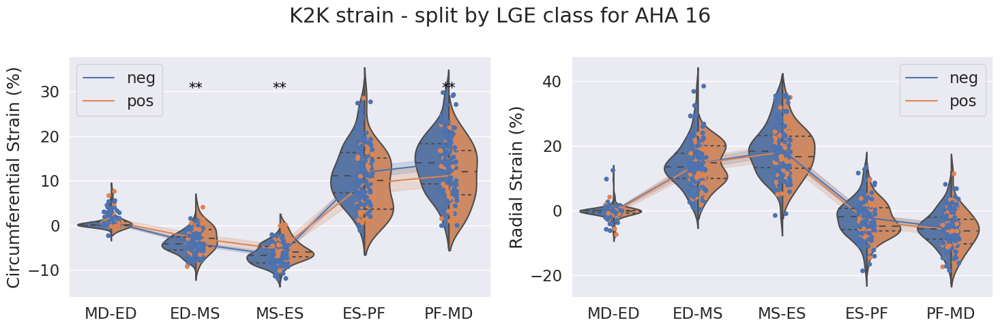

In [75]:
# plot one violinplot per mid-cavity segment for the p2p strains
segments_of_interest = list(range(1,17))
print(segments_of_interest)
for i in segments_of_interest:
    temp = df_strain_p2p[df_strain_p2p['aha']==i]
    _ = plot_strain_per_time(temp, title="K2K strain - split by LGE class for AHA {}".format(i), method='p2p');plt.show()

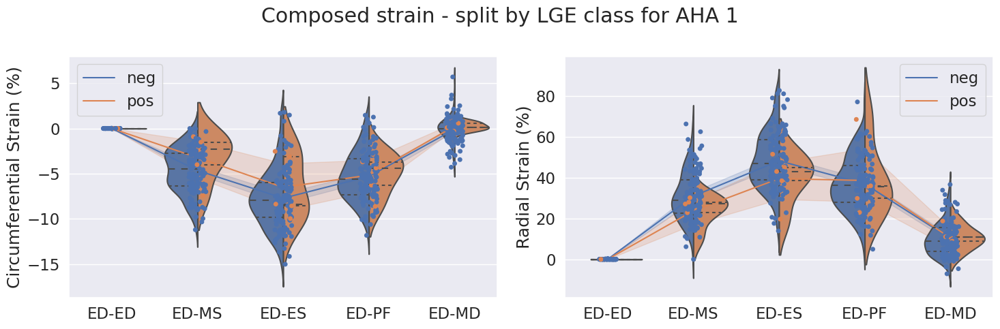

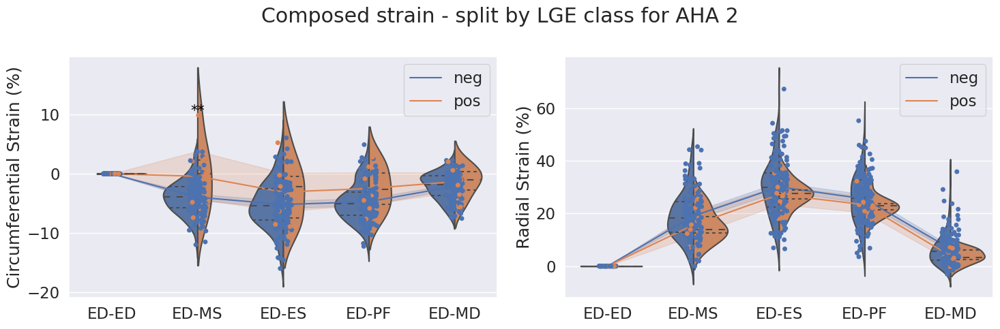

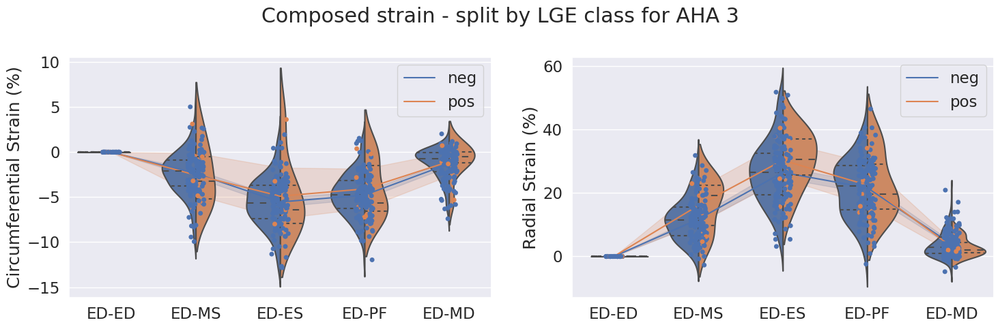

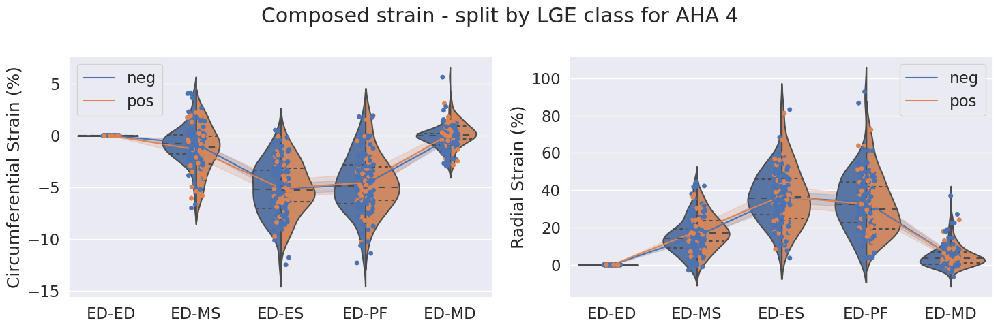

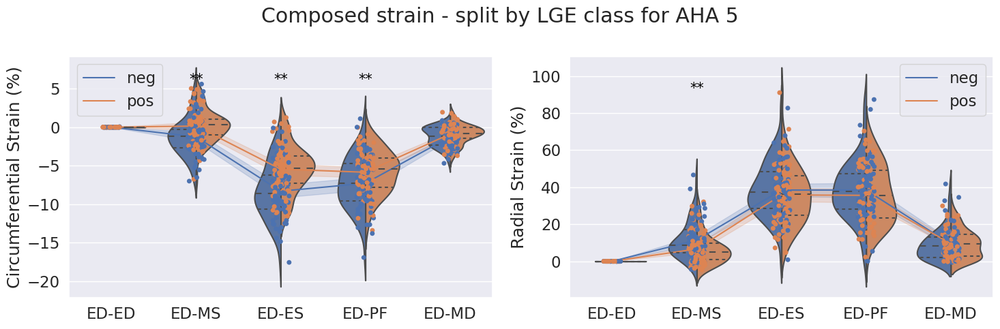

...

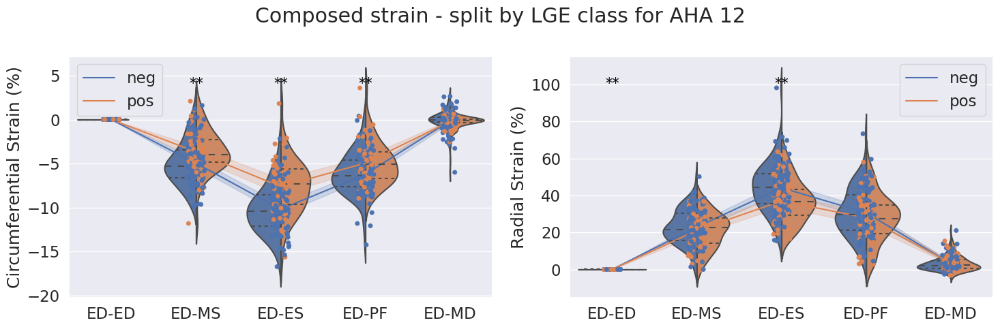

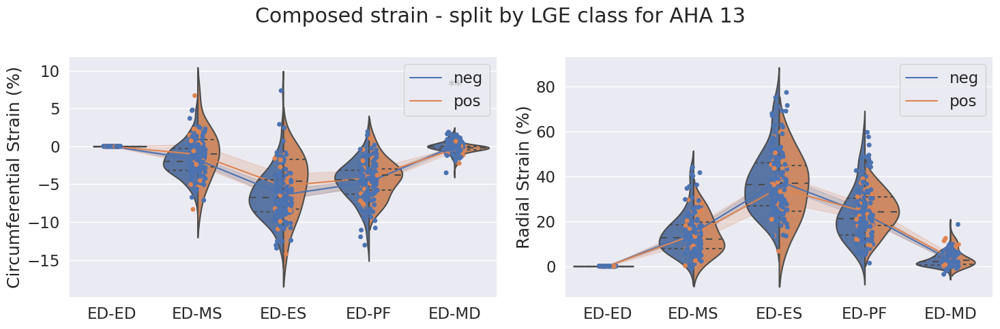

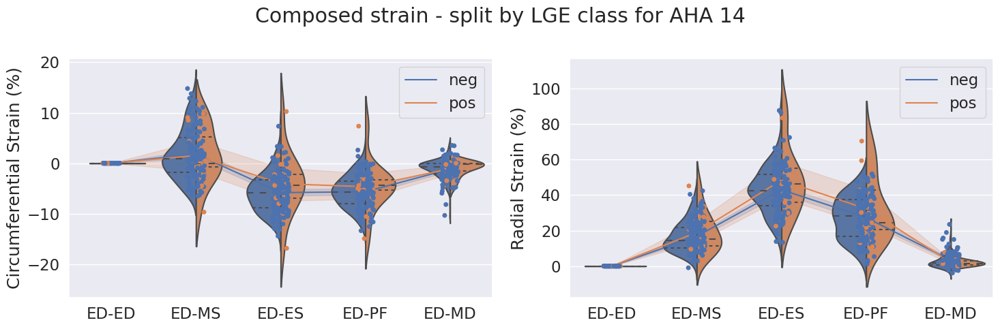

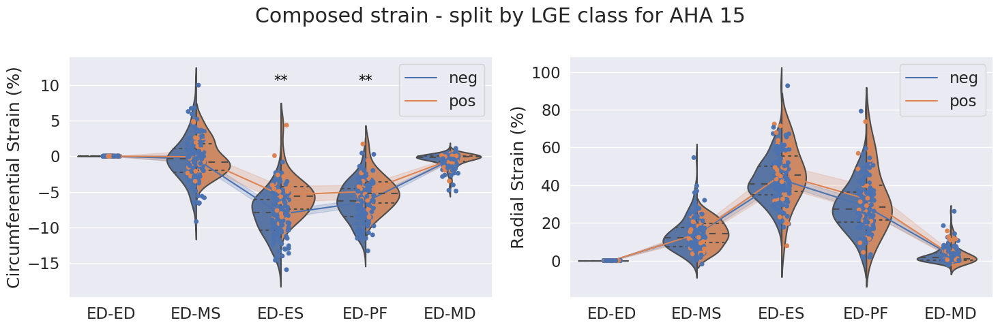

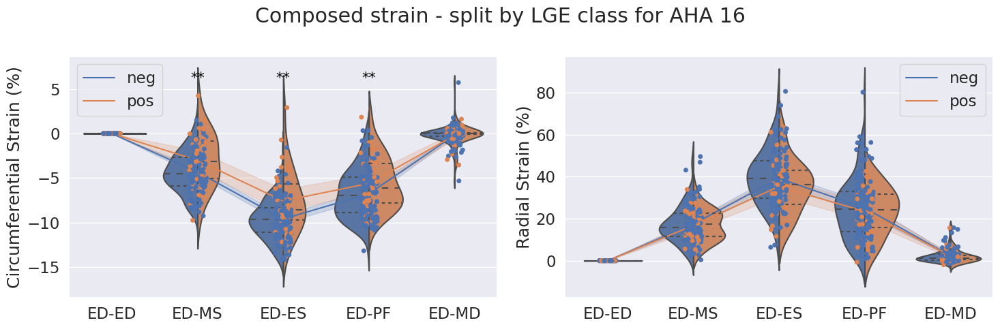

In [74]:
# plot one violinplot per mid-cavity segment for the comp strains
for i in segments_of_interest:
    temp = df_strain_comp[df_strain_comp['aha']==i]
    _ = plot_strain_per_time(temp, title="Composed strain - split by LGE class for AHA {}".format(i), method='comp');plt.show()

In [24]:
df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
temp = df_strain_p2p_positive.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_pos.xlsx'))

In [25]:
df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
temp = df_strain_p2p_negative.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_neg.xlsx'))

In [26]:
# Calc the mean/std for the phase2phases strain per patient, export as xlsx
temp = df_strain_p2p.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_mean.xlsx'))

In [27]:
# Calc the mean/std for the composed strain per patient, export as xlsx
temp = df_strain_comp.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_comp.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_comp_mean.xlsx'))

In [10]:
temp

our_rs_mean  our_cs_mean  our_rs_std  our_cs_std
aha phase                                                  
1   0         0.879806     0.089290    0.398987    0.068014
    1         1.075437     0.148970    0.605217    0.093149
    2         0.658606     0.071887    0.321721    0.048374
    3         0.111531     0.001926    0.081021    0.012156
    4         0.003178     0.004315    0.009424    0.006549
...                ...          ...         ...         ...
16  0         0.272984     0.000857    0.181541    0.032843
    1         0.709379    -0.005076    0.257008    0.040408
    2         0.287029    -0.015934    0.230191    0.030687
    3         0.018638    -0.003388    0.015524    0.005383
    4        -0.004293     0.005913    0.008082    0.012554

[80 rows x 4 columns]

In [17]:
# test, if we use only the mid-cavity segments, this performs better, than taking all segments into account
# only freewall
segments_of_interest = [4,5,6,11,12]
# only mid-cavity
segments_of_interest =[5,6,7,8,9,10,11,12]
df_strain_p2p = df_strain_p2p[df_strain_p2p['aha'].isin(segments_of_interest)]
df_strain_comp = df_strain_comp[df_strain_comp['aha'].isin(segments_of_interest)]

In [55]:
df_strain_comp.head()

,pat,aha,phase,our_rs,our_cs,soa,lge
20,aa_20180710,5,0,0.003685,0.051645,0.0,0.0
21,aa_20180710,5,1,0.913108,0.121693,0.0,0.0
22,aa_20180710,5,2,0.261745,0.014910,0.0,0.0
23,aa_20180710,5,3,0.013298,-0.003892,0.0,0.0
24,aa_20180710,5,4,-0.015184,0.001413,0.0,0.0


# Visualise the vector fields

In [37]:
def plotff(ff, t, z_abs, N):
    nx, ny = (ff.shape[3], ff.shape[2])
    X, Y = np.mgrid[0:nx, 0:ny]
    X, Y = (X[::N, ::N], Y[::N, ::N])
    U = ff[t, z_abs, ::N, ::N, 2]  # x
    V = ff[t, z_abs, ::N, ::N, 1]
    return X, Y, U, V

def plot_1x5_quiver_flowfield(ff, mask_lvmyo=None, cmrs=None, z_abs=None, N=1, crop=None, style=None, headwidth=2.5, headlength=3, width=1, scale=0.5):
    xmin, xmax, ymin, ymax = (crop[0], crop[1], crop[2], crop[3])
    nt = ff.shape[0]

    if style == 'p2p':
        xlabels = ['MD-ED', 'ED-MS', 'MS-ES', 'ES-PF', 'PF-MD']
    elif style == 'comp':
        xlabels = ['ED-ED', 'ED-MS', 'ED-ES', 'ED-PF', 'ED-MD']


    fig, ax = plt.subplots(1, nt, figsize=(12, 10))
    
    for t in range(nt):
        
        X, Y, U, V = plotff(ff=ff, t=t, z_abs=z_abs, N=N)
        ax[t].quiver(Y, X, U, V, units='xy', angles='xy', scale=scale, color='black', headwidth=headwidth,
                     headlength=headlength, width=width)
        
        if mask_lvmyo is not None:
            if style == 'p2p':
                ax[t].imshow(mask_lvmyo[t, z_abs, ..., 0], cmap='Wistia')
                if cmrs is not None: ax[t].imshow(cmrs[t, z_abs, ..., 0], cmap='gray', alpha=0.8)
                
            elif style == 'comp':
                ax[t].imshow(mask_lvmyo[0, z_abs, ..., 0], cmap='Wistia') # only plot ED mask
                if cmrs is not None: ax[t].imshow(cmrs[t, z_abs, ..., 0], cmap='gray', alpha=0.8)
        
        ax[t].set_title(xlabels[t], fontsize=20)
        ax[t].set_xlim(xmin, xmax)
        ax[t].set_ylim(ymax, ymin)
        ax[t].set_aspect('equal')
    plt.setp(ax, xticks=[], yticks=[])
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
import glob
import SimpleITK as sitk
patients = sorted(glob.glob(os.path.join(path_chooser.selected, 'pred/*/')))
@interact_manual
def show_quiever(i=(0,len(patients)), z=(0,32), scale=0.5, N=3, do_mask=False):

    global msks
    pat = patients[i]

    #ffs = sorted([ f for f in glob.glob(os.path.join(pat, "flow_*")) if "flow_0" in f or "flow_1" in f or "flow_2" in f or "flow_3" in f or "flow_4" in f])
    ffs = sorted([ f for f in glob.glob(os.path.join(pat, "flow_masked*"))])
    ffs = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in ffs], axis=-1)
    ffs = np.einsum('cxyzt->tzyxc', ffs)
    
    ffs_comp = sorted([ f for f in glob.glob(os.path.join(pat, "flow_composed*"))])
    ffs_comp = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in ffs_comp], axis=-1)
    ffs_comp = np.einsum('cxyzt->tzyxc', ffs_comp)
    

    msks = sorted(glob.glob(os.path.join(pat, "myo_target*")))
    msks = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in msks], axis=-1)
    msks = np.einsum('xyzt->tzyx', msks)[...,None]
    
    cmrs = sorted(glob.glob(os.path.join(pat, "cmr_moving*")))
    cmrs = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in cmrs], axis=-1)
    cmrs = np.einsum('xyzt->tzyx', cmrs)[...,None]
    
    if do_mask: ffs_comp[np.broadcast_to(msks[1:2]<0.1,shape=ffs_comp.shape)] = 0
    if do_mask: ffs[np.broadcast_to(msks<0.1,shape=ffs.shape)] = 0 # np.roll(msks<0.1, shift=1)
    print(pat.split('/')[-2])
    print('composed')
    plot_1x5_quiver_flowfield(ff=ffs_comp,mask_lvmyo=msks, cmrs=cmrs, z_abs=z, crop=[0,96,0,96], style='comp', N=N, scale=scale)
    print('k2k')
    plot_1x5_quiver_flowfield(ff=ffs,mask_lvmyo=msks, cmrs=cmrs, z_abs=z, crop=[0,96,0,96], style='p2p', N=N, scale=scale)

interactive(children=(IntSlider(value=69, description='i', max=138), IntSlider(value=16, description='z', max=…

In [73]:
# test
print(msks.shape)
def mask_given(nda,channel=0):
    return np.where(nda[...,channel].sum(axis=(-1,-2))>0)
mask_given(msks)

(5, 32, 96, 96, 1)


(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,  0,  1,  2,
         3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
        20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,  0,  1,  2,  3,  4,
         5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
        22, 23, 24, 25, 26, 27,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11,
        12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,

# Examples of dataframe grouby

In [28]:
temp_y = np.stack(df_strain_comp.groupby(['phase'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=0)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(5, 1296)
LGE positive patients:  226
LGE negative patients:  1070


In [29]:
temp_y = np.stack(df_strain_comp.groupby(['phase','aha'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=0)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(80, 81)
LGE positive patients:  45
LGE negative patients:  36


In [30]:
# best groupby selection for patient and segment based target y
temp_y = np.stack(df_strain_comp.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
print('LGE positive segments: ',(temp_y==True).sum())
print('LGE negative segments: ',(temp_y==False).sum())
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 80)
LGE positive segments:  1130
LGE negative segments:  5350
LGE positive patients:  45
LGE negative patients:  36


In [31]:
temp_y = np.stack(df_peak.groupby(['pat'])['lge'].apply(list).values).astype(np.float32) # .reshape((42,16,5))
temp_y = np.stack(df_peak.groupby(['pat'])['lge'].apply(list).values).astype(np.float32) # .reshape((42,16,5))
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 16)
LGE positive patients:  45
LGE negative patients:  36


# Peak Strain via argmax or static phase slicing

Phases: [0:4] --> ED,MS,ES,PF,MD
Usually min(cs) and max(rs) should reflect the phase MS--> ES, which sould be phase==1

In [349]:
# for a patient based pos/neg splitting we need a list of patients with LGE pos and LGE neg
temp_y = np.stack(df_strain_comp.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
pat_pos = df_strain_comp.pat.unique()[temp_y_patients==True]
pat_neg = df_strain_comp.pat.unique()[temp_y_patients==False]
print('LGE positive segments: ',(temp_y==True).sum())
print('LGE negative segments: ',(temp_y==False).sum())
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(138, 80)
LGE positive segments:  2255
LGE negative segments:  8785
LGE positive patients:  83
LGE negative patients:  55


In [350]:
# peak strain values per LGE positive group
pd.set_option('display.float_format', lambda x: '%.4f' % x)
df_peak_positive = df_peak[df_peak['pat'].isin(pat_pos)] * 100
df_peak_positive.describe()

,aha,soa,lge,dmd,prs_com_p,pcs_com_p,prs_com_arg,pcs_com_arg,prs_p2p_p,pcs_p2p_p,prs_p2p_arg,pcs_p2p_arg
count,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000,1328.0000
mean,850.0000,6.4759,33.9608,100.0000,19.3857,-2.0577,37.3713,-6.6897,13.7047,-1.8660,20.8082,-4.8424
std,461.1509,24.6193,47.3755,0.0000,9.5091,3.2050,11.8689,3.1846,6.8007,2.9083,7.1963,2.2495
min,100.0000,0.0000,0.0000,100.0000,-3.7007,-12.8185,7.2506,-17.3853,-6.9116,-10.9376,-0.4729,-12.6816
25%,475.0000,0.0000,0.0000,100.0000,12.4909,-4.1660,29.1583,-8.8716,8.7976,-3.8142,15.8025,-6.2401
50%,850.0000,0.0000,0.0000,100.0000,18.5294,-2.0469,36.8045,-6.5863,13.4414,-1.8914,20.5383,-4.7455
75%,1225.0000,0.0000,100.0000,100.0000,25.6262,-0.0776,44.7909,-4.5438,18.0840,-0.0842,25.7894,-3.2347
max,1600.0000,100.0000,100.0000,100.0000,51.4910,13.5463,80.6321,0.0441,36.6701,12.9056,46.0055,0.6646


In [351]:
# peak strain values per LGE negative group
df_peak_negative = df_peak[df_peak['pat'].isin(pat_neg)] * 100
df_peak_negative.describe()

,aha,soa,lge,dmd,prs_com_p,pcs_com_p,prs_com_arg,pcs_com_arg,prs_p2p_p,pcs_p2p_p,prs_p2p_arg,pcs_p2p_arg
count,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000
mean,850.0000,1.4773,0.0000,100.0000,19.9300,-2.8174,37.8807,-8.0407,13.9686,-2.5243,20.8790,-5.7115
std,461.2393,12.0711,0.0000,0.0000,10.6524,3.2006,12.7456,3.3539,7.5966,2.9006,7.8256,2.3405
min,100.0000,0.0000,0.0000,100.0000,-2.2603,-13.2032,2.0715,-19.3442,-2.6956,-11.5171,0.8489,-15.3357
25%,475.0000,0.0000,0.0000,100.0000,11.9453,-5.0404,28.6987,-10.2525,8.6896,-4.5760,15.3503,-7.3343
50%,850.0000,0.0000,0.0000,100.0000,18.8706,-2.6517,37.6609,-8.1656,13.2498,-2.3921,20.3292,-5.6559
75%,1225.0000,0.0000,0.0000,100.0000,26.1810,-0.5208,46.0978,-5.5474,18.5683,-0.4545,25.8840,-4.1216
max,1600.0000,100.0000,0.0000,100.0000,61.0640,7.0925,90.5609,0.0119,46.5164,7.0358,53.3952,0.1850


In [355]:
df_p2p_pos = df_strain_p2p[df_strain_p2p['pat'].isin(pat_pos)] * 100
df_p2p_pos.describe()

,aha,phase,our_rs,our_cs,soa,lge,dmd
count,6640.0000,6640.0000,6640.0000,6640.0000,6640.0000,6640.0000,6640.0000
mean,850.0000,200.0000,6.9832,1.2400,6.4759,33.9608,100.0000
std,461.0119,141.4320,10.5323,5.7181,24.6119,47.3612,0.0000
min,100.0000,0.0000,-22.7883,-12.6816,0.0000,0.0000,100.0000
25%,475.0000,100.0000,-0.5890,-2.5352,0.0000,0.0000,100.0000
50%,850.0000,200.0000,4.9834,0.3008,0.0000,0.0000,100.0000
75%,1225.0000,300.0000,14.4789,3.7680,0.0000,100.0000,100.0000
max,1600.0000,400.0000,46.0055,28.6558,100.0000,100.0000,100.0000


In [356]:
df_p2p_neg = df_strain_p2p[df_strain_p2p['pat'].isin(pat_neg)] * 100
df_p2p_neg.describe()

,aha,phase,our_rs,our_cs,soa,lge,dmd
count,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000
mean,850.0000,200.0000,6.8709,1.4540,1.4773,0.0000,100.0000
std,461.0296,141.4374,10.6959,6.5780,12.0656,0.0000,0.0000
min,100.0000,0.0000,-18.8241,-15.3357,0.0000,0.0000,100.0000
25%,475.0000,100.0000,-0.6452,-2.9981,0.0000,0.0000,100.0000
50%,850.0000,200.0000,4.1346,0.2543,0.0000,0.0000,100.0000
75%,1225.0000,300.0000,13.9920,4.6010,0.0000,0.0000,100.0000
max,1600.0000,400.0000,53.3952,30.3585,100.0000,0.0000,100.0000


In [358]:
# does the strain values come from two different distributions
from scipy import stats

@interact
def p_test(col = df_p2p_neg.columns, p = df_p2p_neg.phase.unique()):
    try:
        print(df_p2p_neg[col].shape)
        df_temp_neg = df_p2p_neg[df_p2p_neg['phase'].isin([p])]
        df_temp_pos = df_p2p_pos[df_p2p_pos['phase'].isin([p])]
        return stats.ttest_ind(df_temp_neg[col], df_temp_pos[col])
    except Exception as e:
        print(e)

interactive(children=(Dropdown(description='col', options=('pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', '…

In [352]:
# does the strain values come from two different distributions
from scipy import stats
# [c for c in df_peak_negative.columns if 'p2p' in c]
@interact
def p_test(col = df_peak_negative.columns):
    try:
        print(df_peak_negative[col].shape)
        return stats.ttest_ind(df_peak_negative[col], df_peak_positive[col])
    except Exception as e:
        print(e)

interactive(children=(Dropdown(description='col', options=('pat', 'aha', 'soa', 'lge', 'dmd', 'prs_com_p', 'pc…

In [353]:
# segment and phase with the maximal difference between LGE pos and negative group
df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
temp_pos = df_strain_p2p_positive.groupby(['aha','phase']).mean()

df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
temp_neg = df_strain_p2p_negative.groupby(['aha','phase']).mean()

diff = abs(temp_pos - temp_neg)*100
diff[['our_rs', 'our_cs']]

our_rs  our_cs
aha phase                
1   0      0.6969  0.7379
    1      4.2738  1.6631
    2      0.6351  0.6560
    3      3.2295  4.2233
    4      2.1223  1.7816
...           ...     ...
16  0      0.1133  0.1915
    1      0.9443  0.7701
    2      0.1825  1.4019
    3      2.3209  2.1994
    4      1.4234  3.0680

[80 rows x 2 columns]

******************** strain composed ********************
prs: Counter({2: 1026, 3: 266, 1: 4})
pcs: Counter({2: 867, 3: 413, 1: 8, 4: 6, 0: 2})


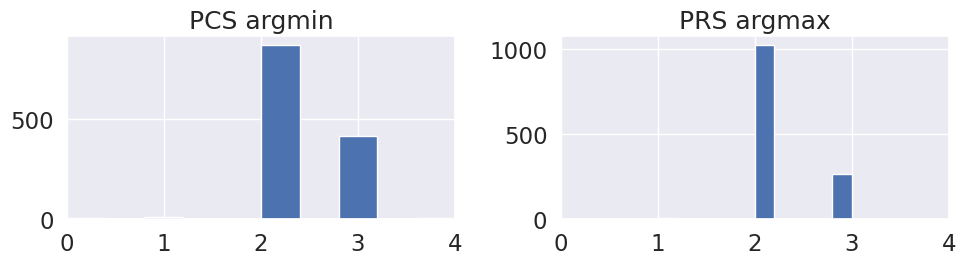

******************** strain p2p ********************
prs: Counter({2: 778, 1: 459, 3: 36, 4: 19, 0: 4})
pcs: Counter({2: 1116, 1: 161, 3: 16, 4: 3})


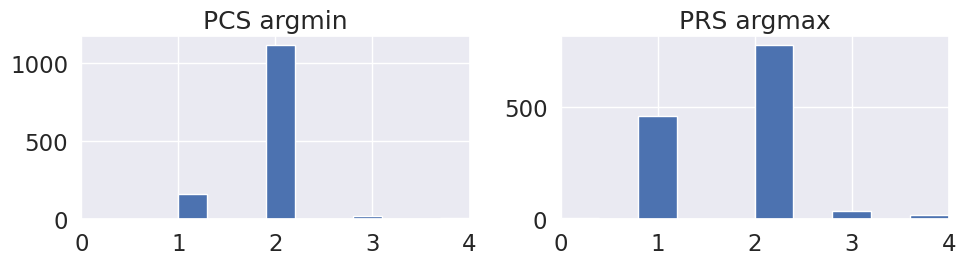

In [25]:
def show_phase_with_max_min_strain(df):
    from collections import Counter
    fig, ax = plt.subplots(1,2,figsize=(10,3))
    # peak radial strain
    rs = np.stack(df.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32)
    # peak circumferential strain
    cs = np.stack(df.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)

    prs_argmax = np.argmax(rs, axis=1)
    pcs_argmin = np.argmin(cs, axis=1)
    print('prs: {}'.format(Counter(prs_argmax)))
    print('pcs: {}'.format(Counter(pcs_argmin)))

    # plot
    ax[0].hist(pcs_argmin)
    ax[0].set_title('PCS argmin')
    ax[0].set_xlim(0,4)
    ax[1].hist(prs_argmax)
    ax[1].set_title('PRS argmax')
    ax[1].set_xlim(0,4)
    plt.tight_layout()
    plt.show()
    
print('*'*20,'strain composed','*'*20)
show_phase_with_max_min_strain(df_strain_comp)
print('*'*20,'strain p2p','*'*20)
show_phase_with_max_min_strain(df_strain_p2p)

******************** strain composed lge pos ********************
prs: Counter({2: 147, 3: 79})
pcs: Counter({2: 123, 3: 100, 4: 2, 1: 1})


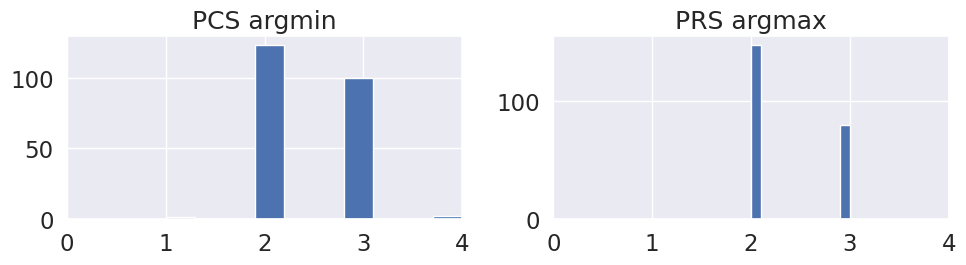

******************** strain composed lge neg ********************
prs: Counter({2: 879, 3: 187, 1: 4})
pcs: Counter({2: 744, 3: 313, 1: 7, 4: 4, 0: 2})


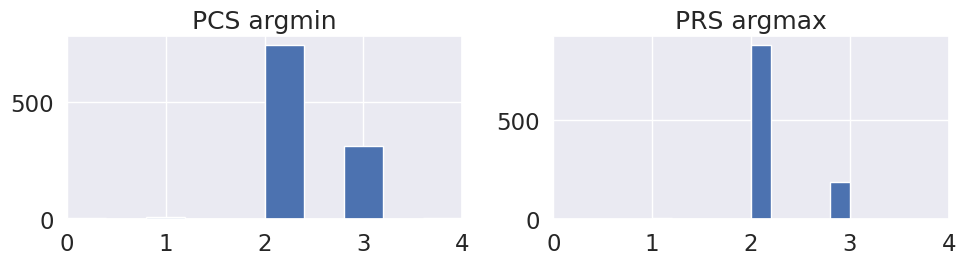

******************** strain p2p lge pos ********************
prs: Counter({2: 144, 1: 60, 3: 19, 4: 3})
pcs: Counter({2: 195, 1: 22, 3: 7, 4: 2})


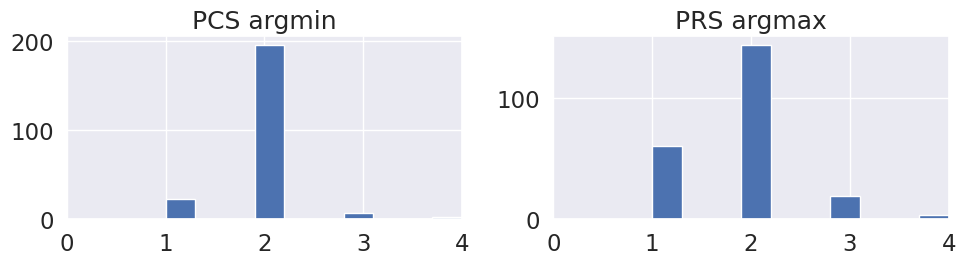

******************** strain p2p lge neg ********************
prs: Counter({2: 634, 1: 399, 3: 17, 4: 16, 0: 4})
pcs: Counter({2: 921, 1: 139, 3: 9, 4: 1})


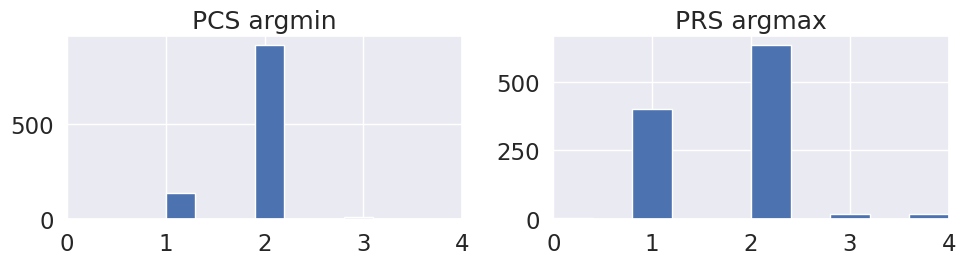

In [27]:
# occurence of the peak and min values per outcome group and strain
df_strain_comp_positive = df_strain_comp[df_strain_comp['lge']==1]
df_strain_comp_negative = df_strain_comp[df_strain_comp['lge']==0]
print('*'*20,'strain composed lge pos','*'*20)
show_phase_with_max_min_strain(df_strain_comp_positive)
print('*'*20,'strain composed lge neg','*'*20)
show_phase_with_max_min_strain(df_strain_comp_negative)

df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
print('*'*20,'strain p2p lge pos','*'*20)
show_phase_with_max_min_strain(df_strain_p2p_positive)
print('*'*20,'strain p2p lge neg','*'*20)
show_phase_with_max_min_strain(df_strain_p2p_negative)

# Pairplot

## Composed Strain

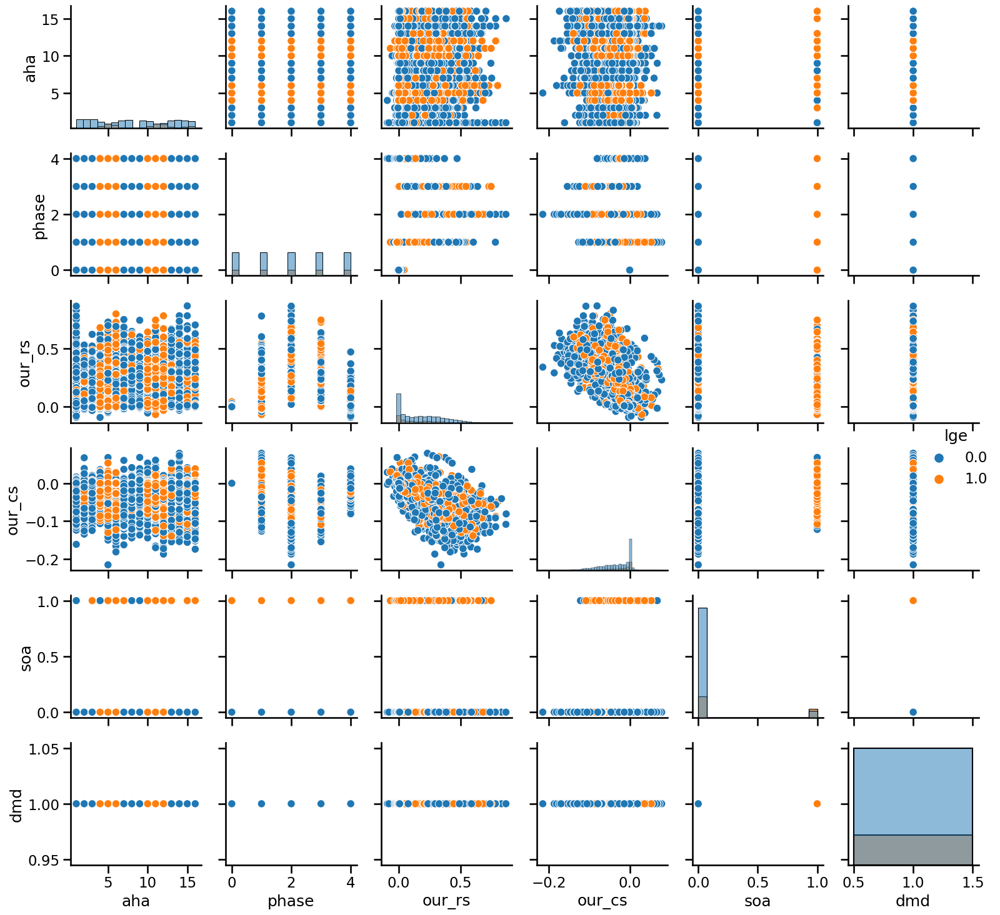

In [166]:
sb.set_context("talk")
g = sb.pairplot(data=df_strain_comp,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

## p2p Strain

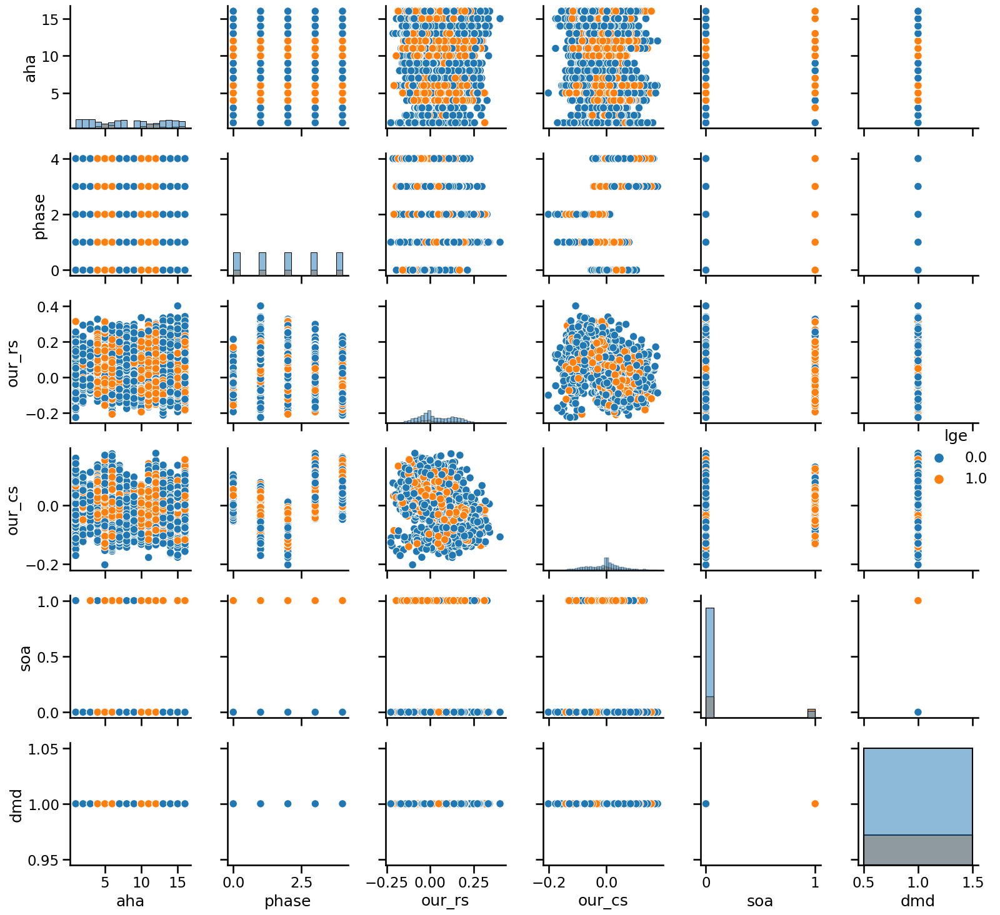

In [167]:
sb.set_context("talk")
g = sb.pairplot(data=df_strain_p2p,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

## Peak Strain

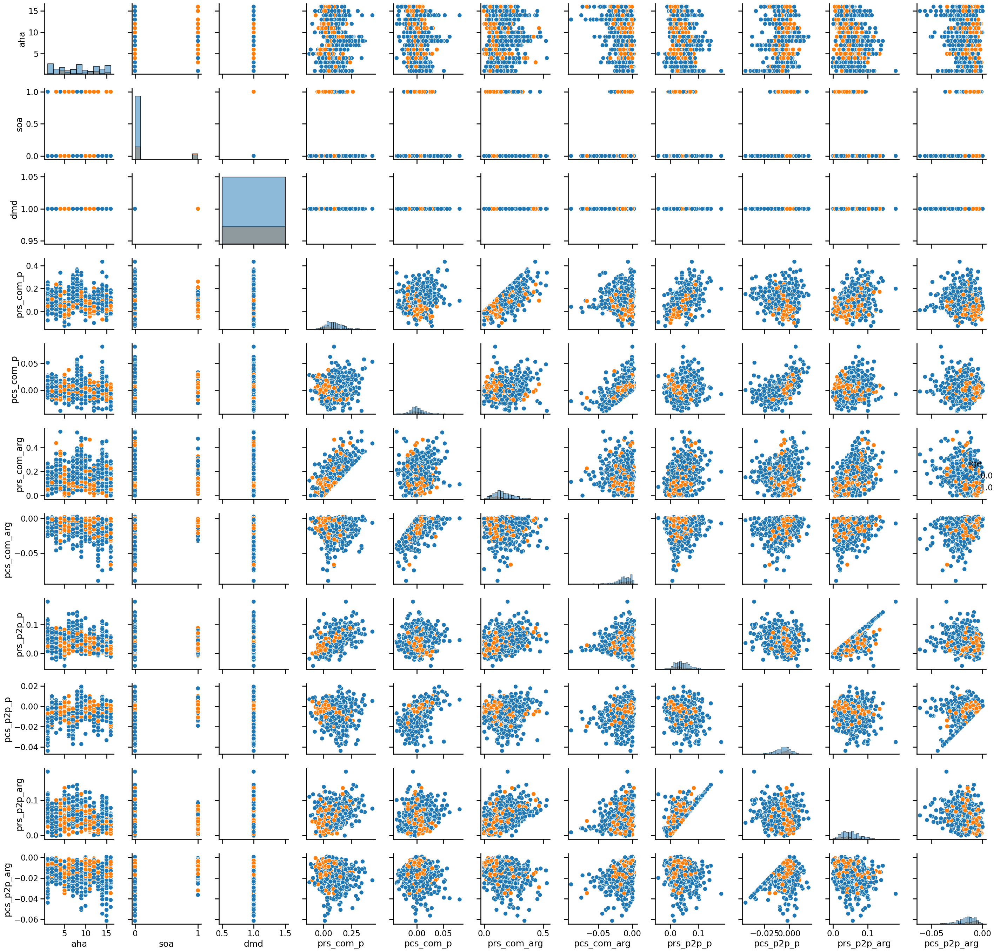

In [36]:
sb.set_context("talk")
g = sb.pairplot(data=df_peak,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

# Correlation plots

## Composed Strain

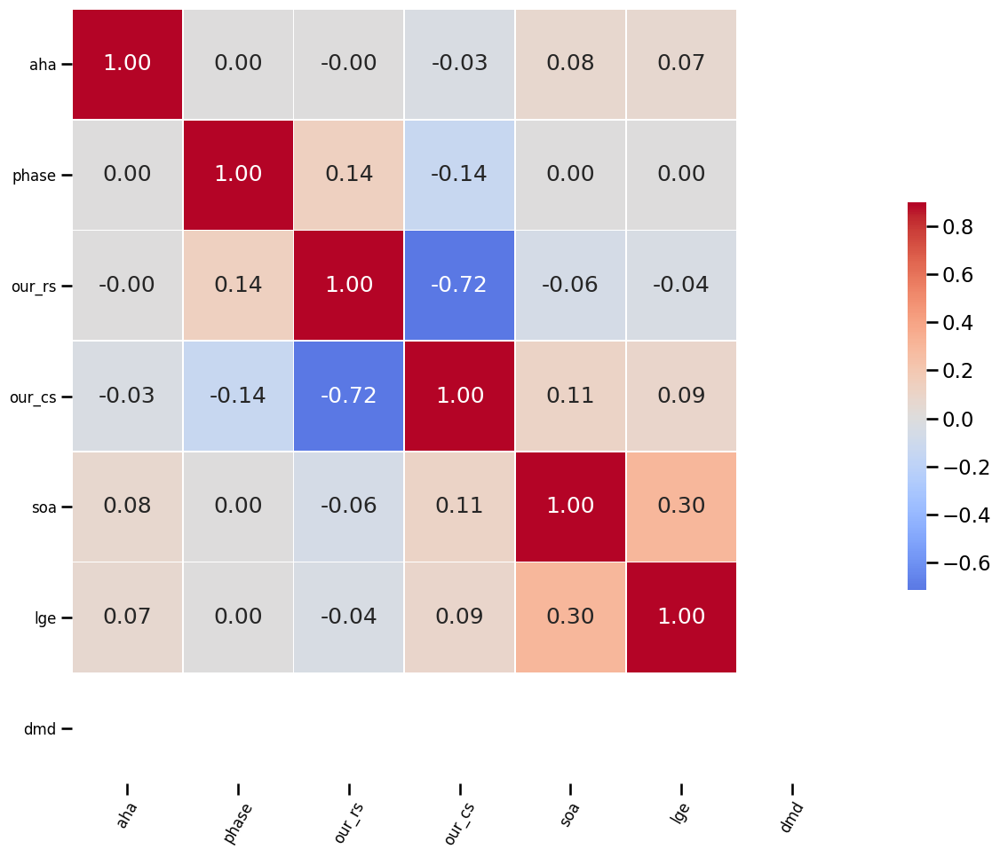

In [168]:
fig, ax = plt.subplots(figsize=(14,10)) 
corr = df_strain_comp.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()
#fig.savefig('strain_corr_cvi_vs_ours.png')

## p2p Strain

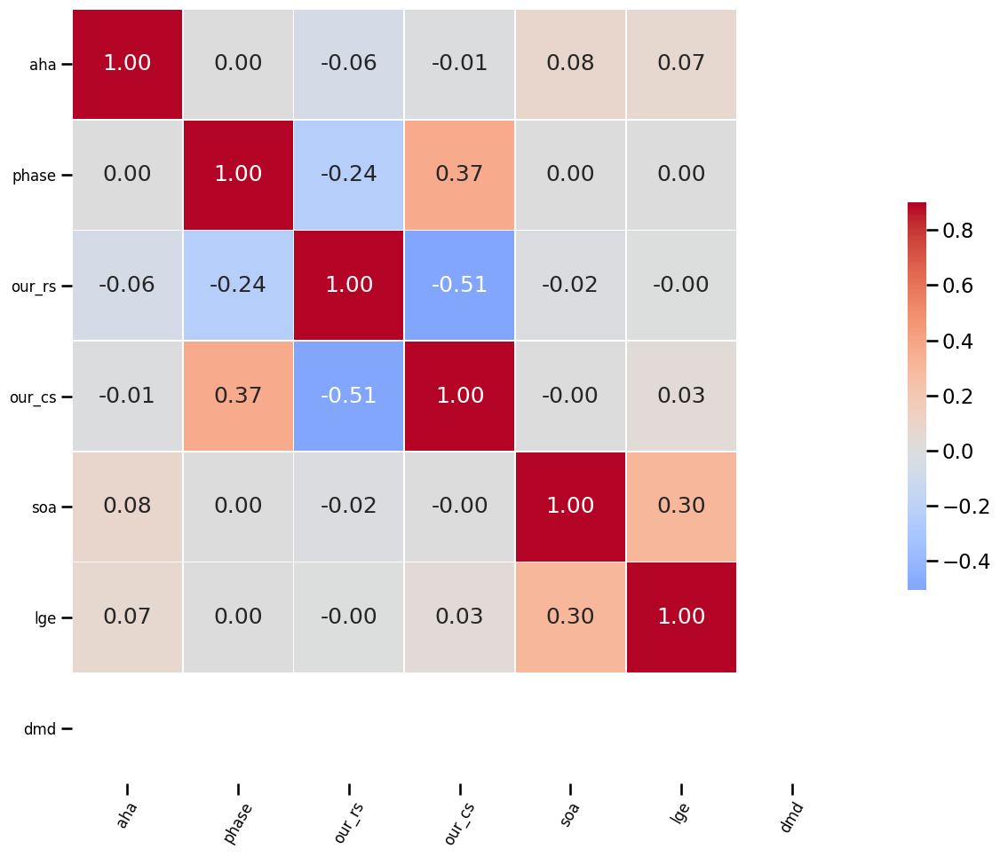

In [169]:
fig, ax = plt.subplots(figsize=(14,10)) 
corr = df_strain_p2p.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()

## Peak Strain

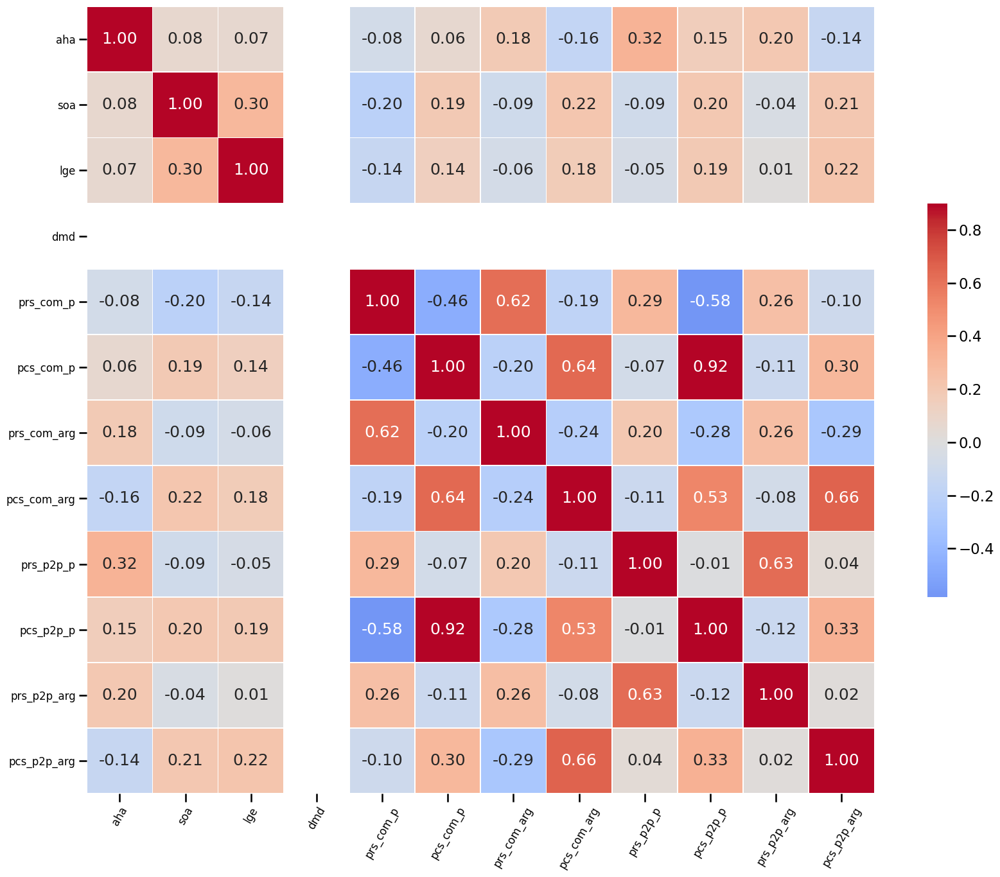

In [170]:
fig, ax = plt.subplots(figsize=(18,14)) 
corr = df_peak.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()

# Strain per phase

Extract one feature Vector per Patient (56 patients times 16 segments times 5 phases times two feature (rs, cs))

- 32 LGE positive patients
- 24 LGE negative patients

## Strain per patient from composed df (56 x 16 x 5 x 2) --> 56, 160

In [13]:
# fit one model per segment
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score
from sklearn.tree import DecisionTreeClassifier
# iterate over the aha segments
# create a sub dataframe of PRS, PCS or comp, p2p
# with the shape: patients, features (56, 2 or 56,psp+com)
# extract x and y for this segment
estimators = []
preds = []
y_tests = []
patients = df_strain_p2p.pat.unique()
X_train, X_test, _, _ = train_test_split(
    patients, patients, test_size=0.2, random_state=42)
# iterate over the segments
for seg in df_strain_p2p.aha.unique():
    print("segment: {}".format(seg))
    # create a temp sub df for only the train patients
    df_strain_p2p_temp = df_strain_p2p[df_strain_p2p['pat'].isin(X_train)]
    df_strain_comp_temp = df_strain_comp[df_strain_comp['pat'].isin(X_train)]
    df_strain_p2p_test = df_strain_p2p[df_strain_p2p['pat'].isin(X_test)]
    df_strain_comp_test = df_strain_comp[df_strain_comp['pat'].isin(X_test)]
    
    # filter the current segment
    seg_of_interest= [seg]
    df_strain_p2p_temp = df_strain_p2p_temp[df_strain_p2p_temp['aha'].isin(seg_of_interest)]
    df_strain_comp_temp = df_strain_comp_temp[df_strain_comp_temp['aha'].isin(seg_of_interest)]
    df_strain_p2p_test = df_strain_p2p_test[df_strain_p2p_test['aha'].isin(seg_of_interest)]
    df_strain_comp_test = df_strain_comp_test[df_strain_comp_test['aha'].isin(seg_of_interest)]
    
    # 280,7 --> 56 patients x 5 phases = 280; and ['pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', 'lge']
    cs_p2p = np.stack(df_strain_p2p_temp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    cs_comp = np.stack(df_strain_comp_temp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    x_ = cs_comp#np.concatenate([cs_p2p, cs_comp], axis=1)
    y_ = np.stack(df_strain_p2p_temp.groupby(['pat','aha'])['lge'].apply(list).values).astype(np.float32)
    y_ = y_.sum(axis=1)>0
    
    cs_p2p_test = np.stack(df_strain_p2p_test.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    cs_comp_test = np.stack(df_strain_comp_test.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    x_test = cs_comp_test#np.concatenate([cs_p2p_test, cs_comp_test], axis=1)
    y_test = np.stack(df_strain_p2p_test.groupby(['pat','aha'])['lge'].apply(list).values).astype(np.float32)
    y_test = y_test.sum(axis=1)>0
    if y_.sum()>4:
        clf_ = make_pipeline(MinMaxScaler(), DecisionTreeClassifier(class_weight='balanced'))
        clf_.fit(x_, y_)
        train_preds = clf_.predict(x_)
        estimators.append(('{}'.format(seg), clf_))
        pred_ = clf_.predict(x_test)
        preds.append(pred_)
        y_tests.append(y_test)
        print(accuracy_score(y_, train_preds))
        print(precision_score(y_, train_preds))
        print(accuracy_score(y_test, pred_))
        print(precision_score(y_test, pred_))
        #cross_validate_f1(x_,y_); plt.show()
    else:
        print('only {} pos examples, no splits possible'.format(y_.sum()))

segment: 4
1.0
1.0
0.5
0.0
segment: 5
1.0
1.0
0.75
1.0
segment: 6
1.0
1.0
0.8333333333333334
0.75
segment: 11
1.0
1.0
0.6666666666666666
0.6
segment: 12
1.0
1.0
0.3333333333333333
0.0


In [14]:
preds_stack = np.stack(preds, axis=0)
print(preds_stack.shape)
y_tests_stack = np.stack(y_tests, axis=0)
for p in range(y_tests_stack.shape[1]):
    print('--'*10)
    print(preds_stack[:,p].sum())
    print(y_tests_stack[:,p].sum())

(5, 12)
--------------------
1
0
--------------------
3
5
--------------------
1
3
--------------------
1
0
--------------------
1
0
--------------------
1
0
--------------------
3
0
--------------------
0
0
--------------------
2
5
--------------------
1
2
--------------------
1
3
--------------------
3
5


In [15]:
# check for nan and infinit values
x[~np.isfinite(x)]

array([], dtype=float32)

# Unsupervised Clustering

In [171]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

#temp_2d = TSNE(n_components=2, perplexity=4, learning_rate=50).fit_transform(x)
#temp_2d = PCA(n_components=2).fit_transform(x)
temp_2d = make_pipeline(
    #StandardScaler(),
    MinMaxScaler(),
    #NeighborhoodComponentsAnalysis(n_components=4, random_state=42),
    TSNE(n_components=2, perplexity=2, learning_rate=500, method='exact', init='pca')
    ).fit_transform(x)

(57, 3)


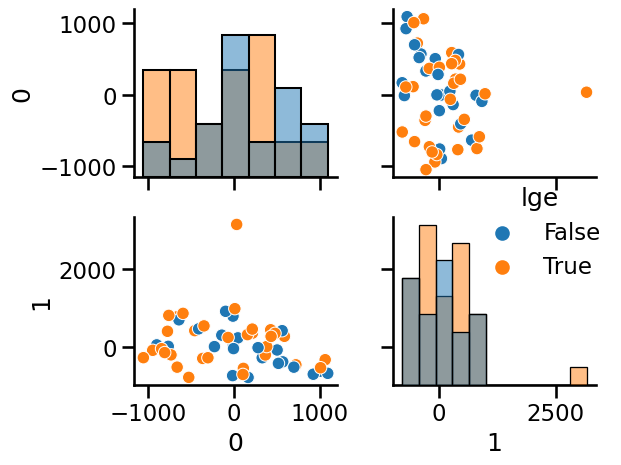

In [172]:
sb.set_context("talk")
df_temp = pd.DataFrame(temp_2d)
df_temp['lge'] = y
print(df_temp.shape)
g = sb.pairplot(data=df_temp,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

In [ ]:
cross_validate_f1(temp_2d,y)

********** Logistic Regression **********
[0.57142857 0.71428571 0.5        0.5        0.42857143]
F1: 0.55 (+/- 0.08) [Logistic Regression]
Recall: 0.54 (+/- 0.10) [Logistic Regression]
Accuracy: 0.48 (+/- 0.11) [Logistic Regression]
********** Random Forest **********
[0.85714286 0.85714286 0.5        0.5        0.71428571]
F1: 0.69 (+/- 0.13) [Random Forest]
Recall: 0.69 (+/- 0.16) [Random Forest]
Accuracy: 0.66 (+/- 0.11) [Random Forest]
********** Naive Bayes **********
[0.85714286 0.85714286 1.         0.83333333 1.        ]
F1: 0.72 (+/- 0.06) [Naive Bayes]
Recall: 0.91 (+/- 0.07) [Naive Bayes]
Accuracy: 0.54 (+/- 0.08) [Naive Bayes]
********** Scaled DecissionTree **********
[0.85714286 0.57142857 0.5        0.5        0.71428571]
F1: 0.67 (+/- 0.13) [Scaled DecissionTree]
Recall: 0.63 (+/- 0.14) [Scaled DecissionTree]
Accuracy: 0.65 (+/- 0.16) [Scaled DecissionTree]
********** KNN **********
[0.71428571 0.42857143 0.5        0.5        0.57142857]
F1: 0.64 (+/- 0.11) [KNN]
Rec

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

# Model Essemble according to different metrics

In [173]:
# best balanced accuracy
results.sort_values(by='rank_test_balanced_accuracy', inplace=True, ascending=True)
params_best_ba = results.head(1)['params'].values[0]
print(params_best_ba)
clf_best_ba = gs.best_estimator_.set_params(**params_best_ba)
clf_best_ba

{'clf': DecisionTreeClassifier(class_weight='balanced', criterion='entropy'), 'clf__criterion': 'entropy', 'scaler': StandardScaler()}


Pipeline(steps=[('scaler', StandardScaler()),
                ('clf',
                 DecisionTreeClassifier(class_weight='balanced',
                                        criterion='entropy'))])

In [174]:
# best f1
results.sort_values(by='rank_test_f1', inplace=True,ascending=True)
params_best_f1 = results.head(1)['params'].values[0]
print(params_best_f1)
clf_best_f1 = gs.best_estimator_.set_params(**params_best_f1)

{'clf': DecisionTreeClassifier(class_weight='balanced', criterion='entropy'), 'clf__criterion': 'entropy', 'scaler': StandardScaler()}


In [175]:
# best average precision
results.sort_values(by='rank_test_accuracy', inplace=True,ascending=True)
params_best_ap = results.head(1)['params'].values[0]
print(params_best_ap)
clf_best_ap = gs.best_estimator_.set_params(**params_best_ap)

{'clf': DecisionTreeClassifier(class_weight='balanced', criterion='entropy'), 'clf__criterion': 'entropy', 'scaler': StandardScaler()}


In [176]:
eclf = VotingClassifier(
        estimators=[
            ('ba', clf_best_ba), 
            ('f1', clf_best_f1),
            ('ap', clf_best_ap)
                   ],
        voting='hard')

In [177]:
plot_report(eclf, x, y, label='ensamble');plt.show()

TypeError: set_params() argument after ** must be a mapping, not str

In [47]:
# re-calculate the scores of the current best clinical practice
from sklearn.metrics import (precision_recall_curve,
                                 PrecisionRecallDisplay)

def my_spec(gt,pred):
        tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
        specificity = tn / (tn+fp)
        return specificity
def my_sens(gt,pred):
    tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
    sensitivity = tp / (tp+fn)
    return sensitivity

TP = 26
FN = 6
FP = 9
TN = 15

tp = [1]*TP
y_pred = tp
y = tp

tn = [0]*TN
y_pred = y_pred + tn
y = y + tn

fp_pred = [1]*FP
fp_y = [0]*FP
y_pred = y_pred + fp_pred
y = y + fp_y

fn_pred = [0]*FN
fn_y = [1]*FN
y_pred = y_pred + fn_pred
y = y + fn_y


import sklearn
CBP_results = sklearn.metrics.precision_recall_fscore_support(y,y_pred, average='binary')
print('specifity: {:.2f}'.format(my_spec(y, y_pred)))
print('sensitivity: {:.2f}'.format(my_sens(y, y_pred)))
print('Precision: {:.2f}\nRecall: {:.2f}'.format(CBP_results[0], CBP_results[1]))
print('F1 Score: {:.2f}'.format(sklearn.metrics.f1_score(y,y_pred)))
print('Accuracy: {:.2f}'.format(sklearn.metrics.accuracy_score(y,y_pred)))
print('Balanced accuracy: {:.2f}'.format(sklearn.metrics.balanced_accuracy_score(y,y_pred)))
print('AUC: {:.2f}'.format(sklearn.metrics.roc_auc_score(y,y_pred)))
disp = ConfusionMatrixDisplay.from_predictions(y, y_pred,labels=[1,0], display_labels=['positive','negative'],colorbar=True)
disp = PrecisionRecallDisplay.from_predictions(y,y_pred)


# calculate the measures for the Current best practice



# Precision = TP / (TP+FP) 


sensitivity: 0.81
specifity: 0.62
Precision: 0.74
Recall: 0.81
F1 Score: 0.78
Accuracy: 0.73
Balanced accuracy: 0.72
AUC: 0.72
